# Проект по курсу "Data Science pro" 
### слушатель: Анна Погорелова

Цель проекта: прогнозирование конечных свойств композиционных материалов.
Задачи:
- обучение алгоритма машинного обучения прогнозировать модуль упругости при растяжении;
- обучение алгоритма машинного обучения прогнозировать прочность при растяжении;
- создание нейронной сети, которая будет рекомендовать соотношение матрица-наполнитель;
- написание пользовательского приложения.

In [92]:
# импортируем необходимые библиотеки
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
from scipy.stats import skew, shapiro, kstest, kurtosis, normaltest
from scipy import stats
from colorama import Fore, Back, Style
import statsmodels.api as sm
from sklearn import preprocessing
from matplotlib.colors import ListedColormap
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA, KernelPCA
# отобразим рисунки непосредственно в тетрадке
%matplotlib inline

### Загрузка данных и формирование датасета

In [93]:
# загружаем файл с характеристиками материала
path = '/Users/kusita_1/Desktop/dataset compositum/X_bp.xlsx'
df_bp = pd.read_excel(path, index_col=0)

In [94]:
# посмотрим размерность таблицы данных
df_bp.shape

(1023, 10)

In [95]:
# посмотрим на столбцы в таблице
df_bp.head(3)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0,1.857143,2030.0,738.736842,30.0,22.267857,100.000000,210.0,70.0,3000.0,220.0
1,1.857143,2030.0,738.736842,50.0,23.750000,284.615385,210.0,70.0,3000.0,220.0
2,1.857143,2030.0,738.736842,49.9,33.000000,284.615385,210.0,70.0,3000.0,220.0


Выводы:
 - второй (соотношение матрица-наполнитель), девятый и десятый (модуль упругости при растяжении и прочность при растяжении) столбцы - зависимые переменные;
 - на первый взгляд, все переменные - численные значения. 

In [96]:
# загружаем данные из второго файла и проверяем его размерность
path = '/Users/kusita_1/Desktop/dataset compositum/X_nup.xlsx'
df_nup = pd.read_excel(path, index_col=0)
df_nup.shape

(1040, 3)

Очевидно, что количество строк во второй таблице на 17 больше, а количество столбцов меньше.

In [97]:
#  посмотрим на столбцы в таблице 
df_nup.head(3)

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0,4.0,57.0
1,0,4.0,60.0
2,0,4.0,70.0


In [98]:
# объединяем две таблицы по индексу, тип объединения согласно условию - 'inner'
df = df_bp.merge(df_nup, left_index=True, right_index=True, how='inner')
df.head(3)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.0,738.736842,30.0,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0
1,1.857143,2030.0,738.736842,50.0,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0
2,1.857143,2030.0,738.736842,49.9,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0


In [99]:
# проверяем размерность итогового датасета
df.shape

(1023, 13)

Итоговый набор данных содержит 1023 строки и 13 столбцов.

17 строк из второго файла были удалены при объединении в связи с отсутствием соответствующих строк в первом файле.

Учитывая, что все зависимые переменные находятся в первом датасете, дополнительные строки из второго не несут смысловой нагрузки.

In [11]:
# сохраним итоговый датасет в отдельный файл для удосбтва доступа у нему впоследствии
df = df.to_csv('/Users/kusita_1/Desktop/df compositum.csv')

### Разведочный анализ данных

In [159]:
df = pd.read_csv('/Users/kusita_1/Desktop/df compositum.csv', index_col=0)

In [12]:
# посмотрим на типы данных и их количество в наборе
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1023 entries, 0 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   int64  
 11  Шаг нашивки           

Все переменные - числовые значения, категориальные признаки отсутствуют.

Пропущенных значений на первый взгляд нет, проверим это дополнительным способом.

In [16]:
df.isna().sum().sum()

0

In [17]:
# проверим датасет на наличие дубликатов
any(df.duplicated())

False

In [26]:
# посмотрим на количество уникальных значений в каждом из столбцов
df.nunique()

Соотношение матрица-наполнитель         1014
Плотность, кг/м3                        1013
модуль упругости, ГПа                   1020
Количество отвердителя, м.%             1005
Содержание эпоксидных групп,%_2         1004
Температура вспышки, С_2                1003
Поверхностная плотность, г/м2           1004
Модуль упругости при растяжении, ГПа    1004
Прочность при растяжении, МПа           1004
Потребление смолы, г/м2                 1003
Угол нашивки, град                         2
Шаг нашивки                              989
Плотность нашивки                        988
dtype: int64

В столбце "Угол нашивки" только два уникальных значения, несмотря на непрерывный характер признака. 

In [19]:
# подсчитаем количество строк для каждого из уникальных значений в столбце "Угол нашивки"
df['Угол нашивки, град'].value_counts()

Угол нашивки, град
0     520
90    503
Name: count, dtype: int64

Количество уникальных значений в столбце распределено практически поровну.

В связи с тем, что в перспективе в модель могут поступить другие значения этой переменной, чтобы ее не ограничивать попробуем оставить данные без изменений.
Однако, при этом может снизиться точность прогнозирования. 

In [20]:
# в этой тетрадке проведем подготовку датасета по первому варианту 
# получим описательуню стастистику 
# транспонируем таблицу для удобства
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,1023.0,2.930366,0.913222,0.389403,2.317887,2.906878,3.552660,5.591742
"Плотность, кг/м3",1023.0,1975.734888,73.729231,1731.764635,1924.155467,1977.621657,2021.374375,2207.773481
"модуль упругости, ГПа",1023.0,739.923233,330.231581,2.436909,500.047452,739.664328,961.812526,1911.536477
"Количество отвердителя, м.%",1023.0,110.570769,28.295911,17.740275,92.443497,110.564840,129.730366,198.953207
"Содержание эпоксидных групп,%_2",1023.0,22.244390,2.406301,14.254985,20.608034,22.230744,23.961934,33.000000
"Температура вспышки, С_2",1023.0,285.882151,40.943260,100.000000,259.066528,285.896812,313.002106,413.273418
"Поверхностная плотность, г/м2",1023.0,482.731833,281.314690,0.603740,266.816645,451.864365,693.225017,1399.542362
"Модуль упругости при растяжении, ГПа",1023.0,73.328571,3.118983,64.054061,71.245018,73.268805,75.356612,82.682051
"Прочность при растяжении, МПа",1023.0,2466.922843,485.628006,1036.856605,2135.850448,2459.524526,2767.193119,3848.436732
"Потребление смолы, г/м2",1023.0,218.423144,59.735931,33.803026,179.627520,219.198882,257.481724,414.590628


Разброс данных в различных стобцах значительный.

В перспективе с целью уравновесить вклад каждого из признаков в прогнозирование зависимых переменных целесообразно выполнить масштабирование (нормализацию).

In [23]:
# выведем среднее и медианное значения для каждого столбца
# транспонируем таблицу для удобства
mean_median = df.describe()
mean_median.loc[['mean', '50%']].T

,mean,50%
Соотношение матрица-наполнитель,2.930366,2.906878
"Плотность, кг/м3",1975.734888,1977.621657
"модуль упругости, ГПа",739.923233,739.664328
"Количество отвердителя, м.%",110.570769,110.564840
"Содержание эпоксидных групп,%_2",22.244390,22.230744
"Температура вспышки, С_2",285.882151,285.896812
"Поверхностная плотность, г/м2",482.731833,451.864365
"Модуль упругости при растяжении, ГПа",73.328571,73.268805
"Прочность при растяжении, МПа",2466.922843,2459.524526
"Потребление смолы, г/м2",218.423144,219.198882


Среднее и медианное значения в столбцах близки друг к другу, за исключением столбца "Угол нашивки", где всего два уникальных значения и по этой причине среднее получилось больше, чем медиана. 

#### Визуализация данных

Визуализация данных на данном этапе позволит 
- оценить характер распределения переменных, 
- наличие корреляционных связей между ними, 
- необходимость работы с выбросами.

In [46]:
# определим стиль визуализации 
sns.set(style='whitegrid')

In [21]:
# напишем функцию для визуализации гистограмм, квантиль-квантиль графиков и отображения статистических параметров всех переменных
# выберем коэффициенты асимметрии (skewness) и эксцесса (kurtosis) для примерной оценки характера распределения,
# а также выполним и выведем на экран результаты трех более точных тестов на нормальность: 
# критерий Шапиро-Уилка, Колмогорова-Смирнова и критерий К-квадрата Д'Агостино
# выделим красным цветом результаты, свидетельствующие о распределении, отличным от нормального
def normality_tests(data):
  """Для переменной, подаваемой в качестве параметра в виде одномерной структуры данных:
  - печатает максимальное и минимальное значения переменной;
  - рассчитывает и печатает среднее значение, стандартное отклонение, коэффициенты
  асимметрии и эксцесса, критерии тестов на нормальность распределения: Шапиро-Уилка, 
  Колмогорова-Смирнова и К-квадрата Д'Агостино; 
  - строит гистограмму c кривой ядерной оценки плотности;
  - строит квантиль-квантиль график."""
  print('\033[1m' + f'Для параметра {i}')
  print('\033[0m', end='')
  print('Mаксимальное значение:', np.max(data))
  print('Минимальное значение', np.min(data))
  print('Среднее:', np.mean(data))
  print('Стандартное отклонение:', np.std(data))
  alpha = 0.05
  skewness = skew(df[[i]])
  if skewness > 1 or skewness < -1:
      print('Коэф. асимметрии (skewness):', Fore.RED + str(skewness))
      print('Распределение отлично от нормального')
      print(Style.RESET_ALL, end='')
  else:
      print('Коэф. асимметрии (skewness):', skew(data))
  kurt = kurtosis(df[[i]])
  if kurt > 3 or kurt < - 3:
      print('Коэф. эксцесса (kurtosis):', Fore.RED + str(kurt)) 
      print('Распределение отлично от нормального')
      print(Style.RESET_ALL, end='')
  else:
      print('Коэф. эксцесса (kurtosis):', kurtosis(data))
  statistic, pvalue = shapiro(df[[i]])
  if pvalue < alpha:
      print('Критерий Шапиро-Уилка (Shapiro-Wilk):', f'statistic={statistic}, pvalue=', Fore.RED + str(pvalue))
      print('Нулевая гипотеза может быть отвергнута')
      print(Style.RESET_ALL, end='')
  else:
      print('Критерий Шапиро-Уилка (Shapiro-Wilk):', f'statistic={statistic}, pvalue={pvalue}')
  ksresult = kstest(data, 'norm')
  statistic = ksresult[0]
  pvalue = ksresult[1]
  if pvalue < alpha:
      print('Критерий Колмогорова-Смирнова (Kolmogorov):', f'statistic={statistic}, pvalue=', Fore.RED + str(pvalue))
      print('Нулевая гипотеза может быть отвергнута')
      print(Style.RESET_ALL, end='')
  else:
      print('Критерий Колмогорова-Смирнова (Kolmogorov):', f'statistic={statistic}, pvalue={pvalue}')
  statistic, pvalue = normaltest(df[[i]])
  if pvalue < alpha:
      print("Критерий К-квадрата Д'Агостино (normaltest):", f'statistic={statistic}, pvalue=', Fore.RED + str(pvalue))
      print('Нулевая гипотеза может быть отвергнута')
      print(Style.RESET_ALL, end='')
  else:
      print("Критерий К-квадрата Д'Агостино (normaltest):", f'statistic={statistic}, pvalue={pvalue}')
  sns.histplot(data, bins = 50, kde=True)
  plt.ylabel(None)
  fig = sm.qqplot(data, line='45', fit=True)
  plt.xlabel('Теоретические квантили', fontsize = 10)
  plt.ylabel('Упорядоченные значения', fontsize = 10)
  plt.show()

Для параметра Соотношение матрица-наполнитель
Mаксимальное значение: 5.59174159869754
Минимальное значение 0.389402605178414
Среднее: 2.9303657734325483
Стандартное отклонение: 0.9127757819049905
Коэф. асимметрии (skewness): 0.08215047390733503
Коэф. эксцесса (kurtosis): -0.20422037310846086
Критерий Шапиро-Уилка (Shapiro-Wilk): statistic=0.9980301856994629, pvalue=0.27785179018974304
Критерий Колмогорова-Смирнова (Kolmogorov): statistic=0.8850661943678824, pvalue= 0.0
Нулевая гипотеза может быть отвергнута
Критерий К-квадрата Д'Агостино (normaltest): statistic=[3.08390672], pvalue=[0.21396275]


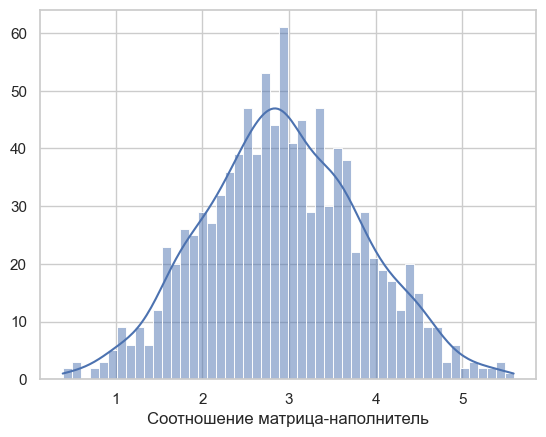

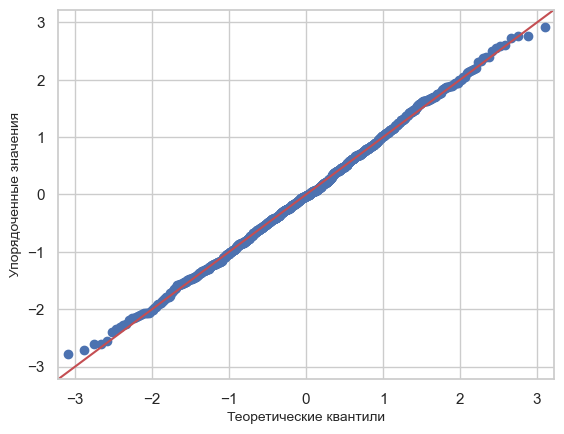

Для параметра Плотность, кг/м3
Mаксимальное значение: 2207.77348061119
Минимальное значение 1731.764635096
Среднее: 1975.7348881101545
Стандартное отклонение: 73.69318594788827
Коэф. асимметрии (skewness): 0.05854323312878896
Коэф. эксцесса (kurtosis): 0.05745882123102097
Критерий Шапиро-Уилка (Shapiro-Wilk): statistic=0.9985235333442688, pvalue=0.5498724579811096
Критерий Колмогорова-Смирнова (Kolmogorov): statistic=1.0, pvalue= 0.0
Нулевая гипотеза может быть отвергнута
Критерий К-квадрата Д'Агостино (normaltest): statistic=[0.82356644], pvalue=[0.66246787]


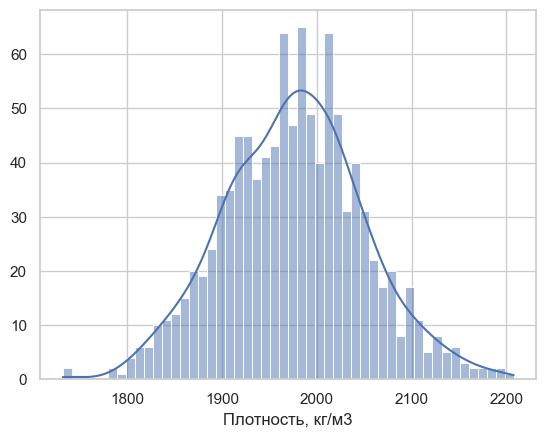

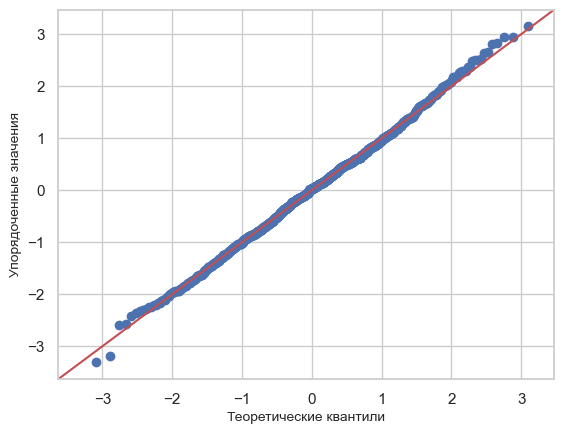

Для параметра модуль упругости, ГПа
Mаксимальное значение: 1911.53647700054
Минимальное значение 2.4369087535075
Среднее: 739.9232327560721
Стандартное отклонение: 330.07013758850314
Коэф. асимметрии (skewness): 0.11999727729086174
Коэф. эксцесса (kurtosis): -0.21118318382570234
Критерий Шапиро-Уилка (Shapiro-Wilk): statistic=0.9957821369171143, pvalue= 0.0066343857906758785
Нулевая гипотеза может быть отвергнута
Критерий Колмогорова-Смирнова (Kolmogorov): statistic=0.9990153312915001, pvalue= 0.0
Нулевая гипотеза может быть отвергнута
Критерий К-квадрата Д'Агостино (normaltest): statistic=[4.55552345], pvalue=[0.1025134]


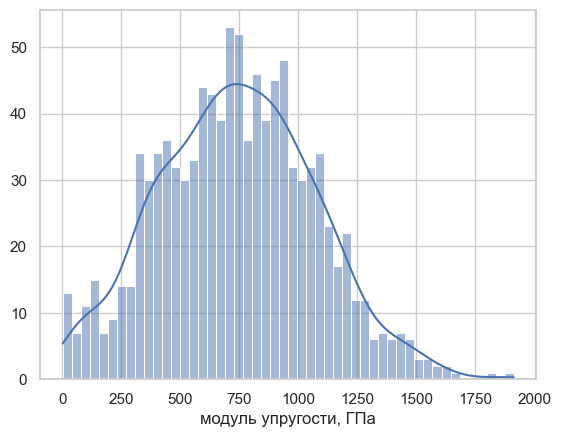

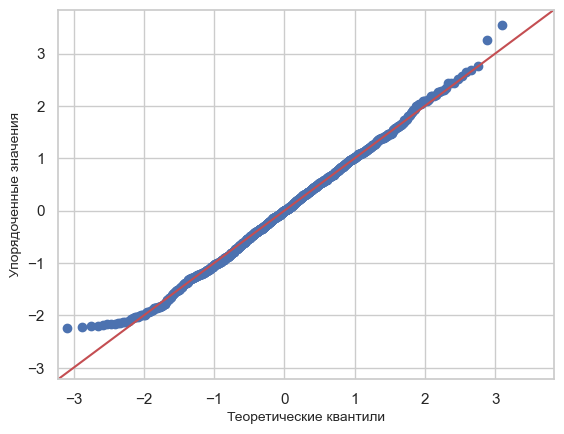

Для параметра Количество отвердителя, м.%
Mаксимальное значение: 198.953207190451
Минимальное значение 17.7402745562519
Среднее: 110.57076864736254
Стандартное отклонение: 28.28207803873755
Коэф. асимметрии (skewness): -0.08607032706818164
Коэф. эксцесса (kurtosis): 0.13919209027132995
Критерий Шапиро-Уилка (Shapiro-Wilk): statistic=0.9978459477424622, pvalue=0.20873218774795532
Критерий Колмогорова-Смирнова (Kolmogorov): statistic=1.0, pvalue= 0.0
Нулевая гипотеза может быть отвергнута
Критерий К-квадрата Д'Агостино (normaltest): statistic=[2.22304004], pvalue=[0.3290584]


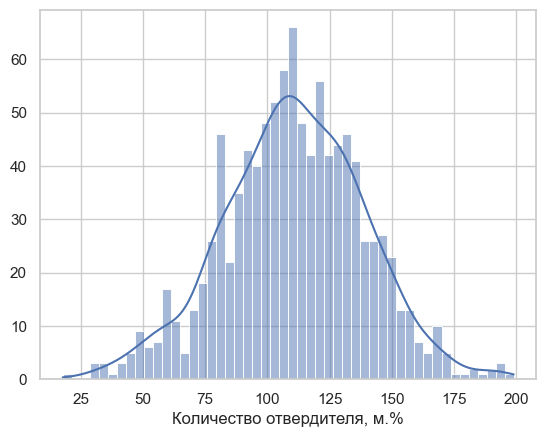

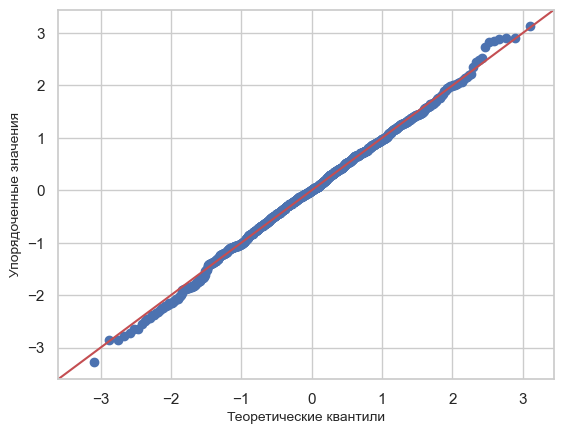

Для параметра Содержание эпоксидных групп,%_2
Mаксимальное значение: 33.0
Минимальное значение 14.2549854977161
Среднее: 22.24438954776773
Стандартное отклонение: 2.4051249036363265
Коэф. асимметрии (skewness): 0.05417837966920955
Коэф. эксцесса (kurtosis): 0.03656688330785274
Критерий Шапиро-Уилка (Shapiro-Wilk): statistic=0.997999906539917, pvalue=0.2653270959854126
Критерий Колмогорова-Смирнова (Kolmogorov): statistic=1.0, pvalue= 0.0
Нулевая гипотеза может быть отвергнута
Критерий К-квадрата Д'Агостино (normaltest): statistic=[0.62929026], pvalue=[0.7300479]


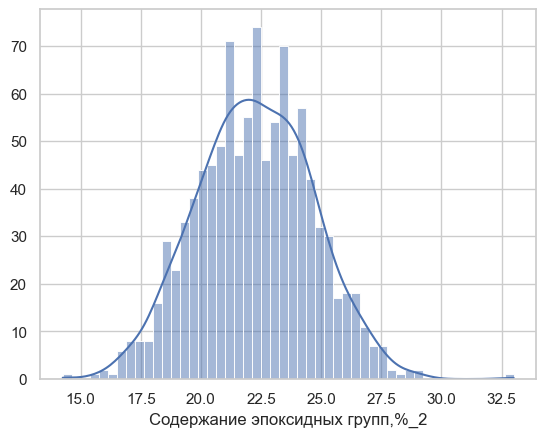

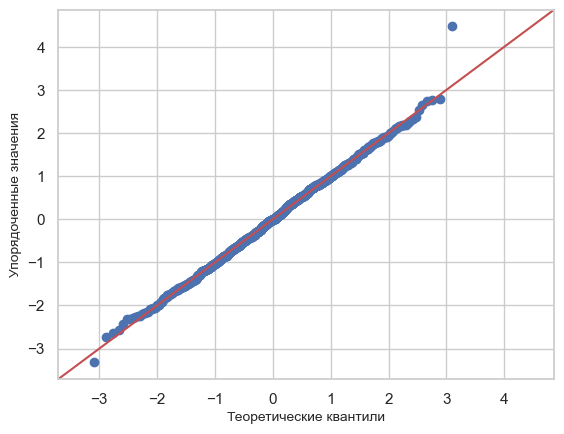

Для параметра Температура вспышки, С_2
Mаксимальное значение: 413.273418243566
Минимальное значение 100.0
Среднее: 285.88215135162187
Стандартное отклонение: 40.92324369166693
Коэф. асимметрии (skewness): -0.05644348004065189
Коэф. эксцесса (kurtosis): 0.18114755485580591
Критерий Шапиро-Уилка (Shapiro-Wilk): statistic=0.9980418682098389, pvalue=0.2828235924243927
Критерий Колмогорова-Смирнова (Kolmogorov): statistic=1.0, pvalue= 0.0
Нулевая гипотеза может быть отвергнута
Критерий К-квадрата Д'Агостино (normaltest): statistic=[2.01769101], pvalue=[0.36463971]


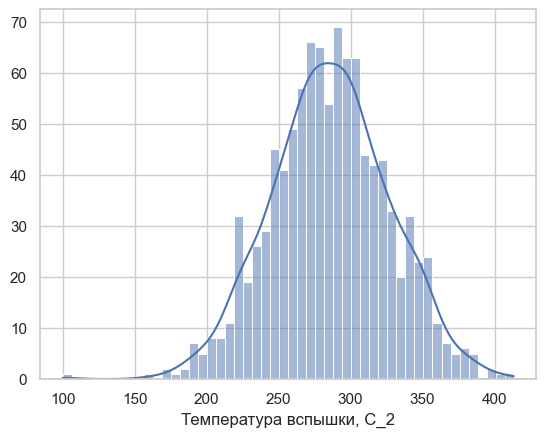

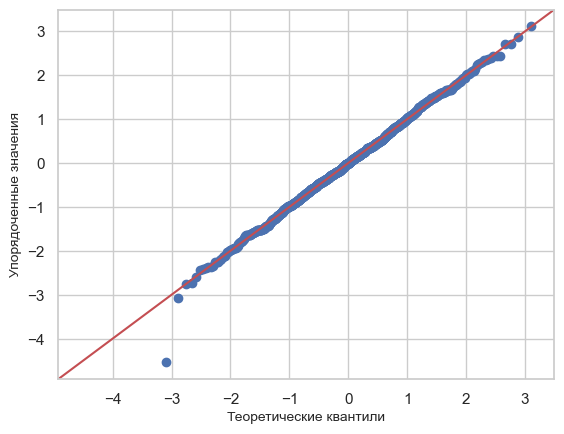

Для параметра Поверхностная плотность, г/м2
Mаксимальное значение: 1399.54236233989
Минимальное значение 0.603739925153945
Среднее: 482.73183303841853
Стандартное отклонение: 281.17716165829404
Коэф. асимметрии (skewness): 0.394885855345264
Коэф. эксцесса (kurtosis): -0.44281878519445605
Критерий Шапиро-Уилка (Shapiro-Wilk): statistic=0.9775959849357605, pvalue= 1.848812249127807e-11
Нулевая гипотеза может быть отвергнута
Критерий Колмогорова-Смирнова (Kolmogorov): statistic=0.9970467056181723, pvalue= 0.0
Нулевая гипотеза может быть отвергнута
Критерий К-квадрата Д'Агостино (normaltest): statistic=[38.51062683], pvalue= [4.34033886e-09]
Нулевая гипотеза может быть отвергнута


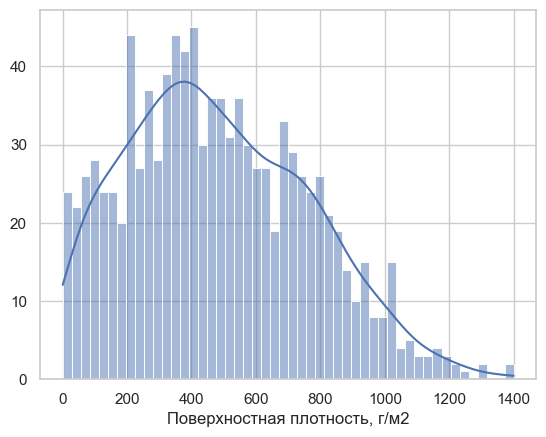

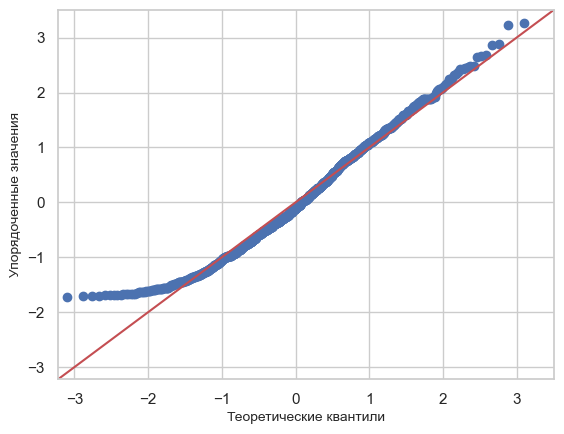

Для параметра Модуль упругости при растяжении, ГПа
Mаксимальное значение: 82.682051035271
Минимальное значение 64.0540605597917
Среднее: 73.32857125009068
Стандартное отклонение: 3.117458087183369
Коэф. асимметрии (skewness): 0.12709647236217236
Коэф. эксцесса (kurtosis): -0.16646020713883214
Критерий Шапиро-Уилка (Shapiro-Wilk): statistic=0.9977318048477173, pvalue=0.1739068478345871
Критерий Колмогорова-Смирнова (Kolmogorov): statistic=1.0, pvalue= 0.0
Нулевая гипотеза может быть отвергнута
Критерий К-квадрата Д'Агостино (normaltest): statistic=[3.94580594], pvalue=[0.1390526]


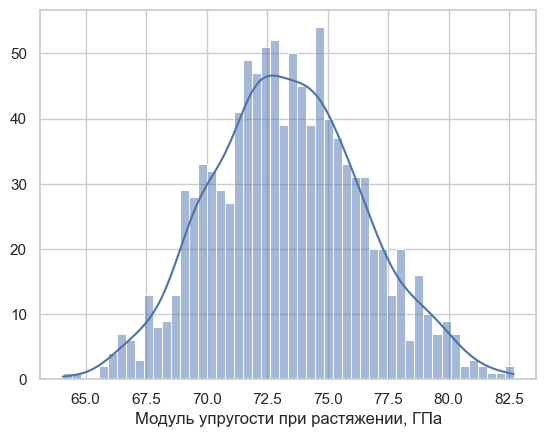

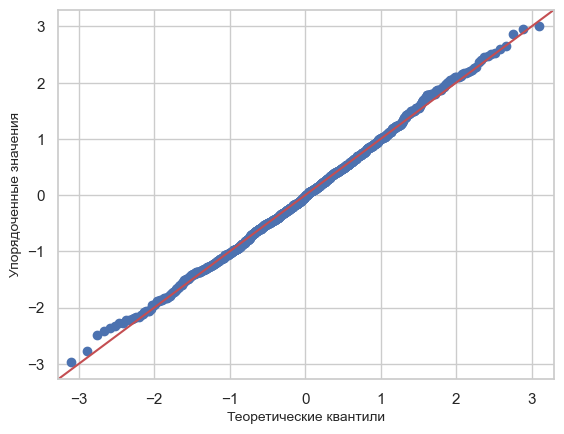

Для параметра Прочность при растяжении, МПа
Mаксимальное значение: 3848.43673187618
Минимальное значение 1036.85660535
Среднее: 2466.922842697902
Стандартное отклонение: 485.3905934037855
Коэф. асимметрии (skewness): 0.0784493597849788
Коэф. эксцесса (kurtosis): 0.016178734221863333
Критерий Шапиро-Уилка (Shapiro-Wilk): statistic=0.9978814125061035, pvalue=0.22074837982654572
Критерий Колмогорова-Смирнова (Kolmogorov): statistic=1.0, pvalue= 0.0
Нулевая гипотеза может быть отвергнута
Критерий К-квадрата Д'Агостино (normaltest): statistic=[1.10911795], pvalue=[0.5743255]


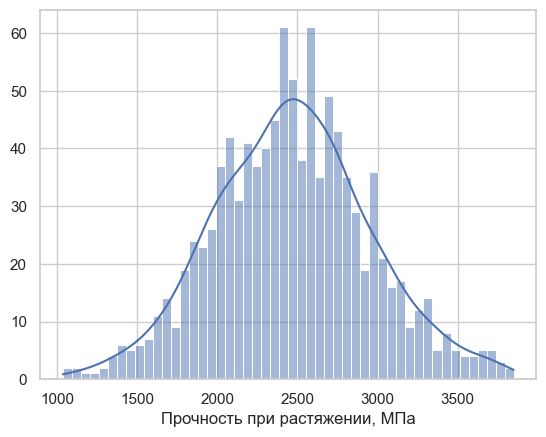

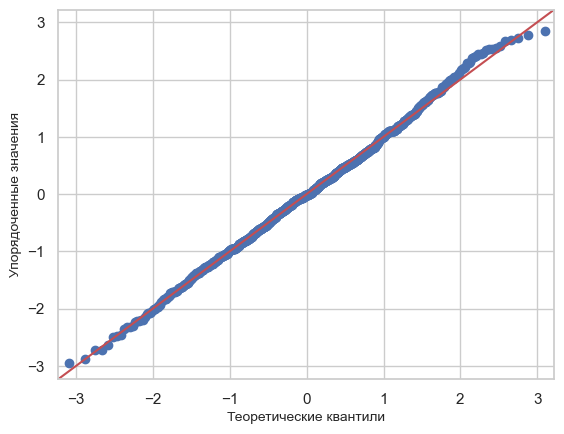

Для параметра Потребление смолы, г/м2
Mаксимальное значение: 414.590628361534
Минимальное значение 33.8030255329625
Среднее: 218.42314367654285
Стандартное отклонение: 59.70672728767531
Коэф. асимметрии (skewness): 0.00628504890441259
Коэф. эксцесса (kurtosis): -0.1294260111723915
Критерий Шапиро-Уилка (Shapiro-Wilk): statistic=0.9987567067146301, pvalue=0.7093469500541687
Критерий Колмогорова-Смирнова (Kolmogorov): statistic=1.0, pvalue= 0.0
Нулевая гипотеза может быть отвергнута
Критерий К-квадрата Д'Агостино (normaltest): statistic=[0.64485834], pvalue=[0.72438724]


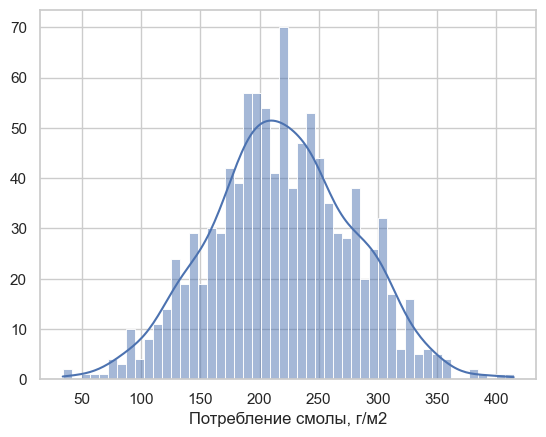

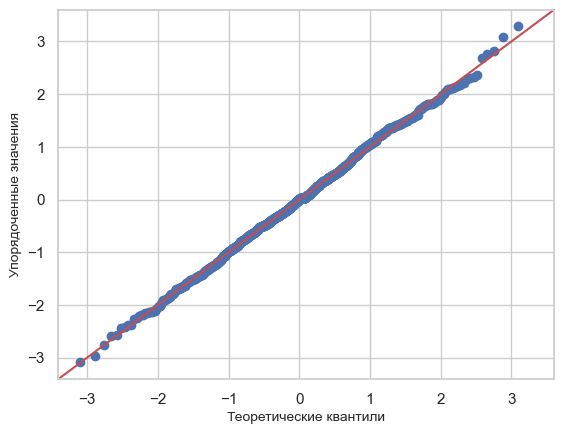

Для параметра Угол нашивки, град
Mаксимальное значение: 90
Минимальное значение 0
Среднее: 44.252199413489734
Стандартное отклонение: 44.99378617412403
Коэф. асимметрии (skewness): 0.03324017159241987
Коэф. эксцесса (kurtosis): -1.9988950909925063
Критерий Шапиро-Уилка (Shapiro-Wilk): statistic=0.6364915370941162, pvalue= 5.735514614481476e-42
Нулевая гипотеза может быть отвергнута
Критерий Колмогорова-Смирнова (Kolmogorov): statistic=0.5, pvalue= 5.130378383938211e-237
Нулевая гипотеза может быть отвергнута
Критерий К-квадрата Д'Агостино (normaltest): statistic=[3844.27461303], pvalue= [0.]
Нулевая гипотеза может быть отвергнута


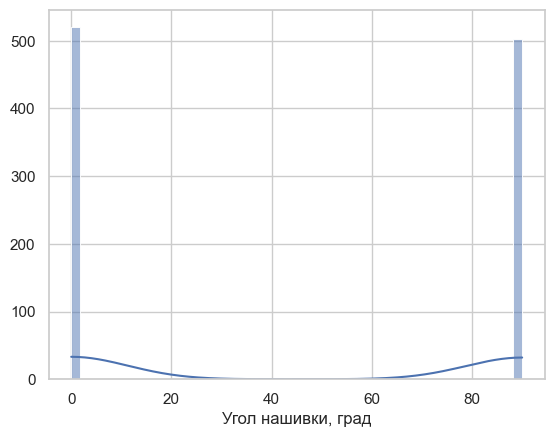

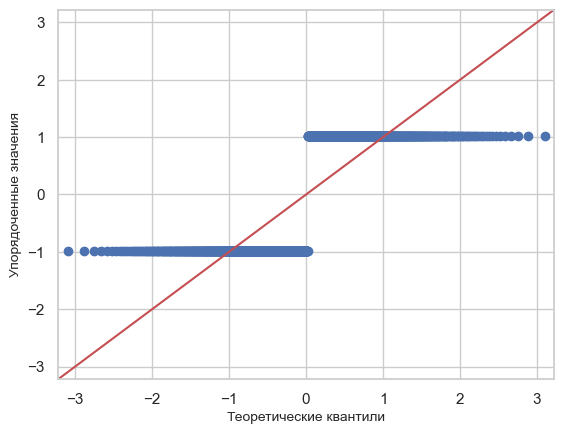

Для параметра Шаг нашивки
Mаксимальное значение: 14.4405218753969
Минимальное значение 0.0
Среднее: 6.8992220776750175
Стандартное отклонение: 2.5622138500394365
Коэф. асимметрии (skewness): 0.10184777153596856
Коэф. эксцесса (kurtosis): -0.018606675940957107
Критерий Шапиро-Уилка (Shapiro-Wilk): statistic=0.9977385401725769, pvalue=0.17580671608448029
Критерий Колмогорова-Смирнова (Kolmogorov): statistic=0.9560619771729013, pvalue= 0.0
Нулевая гипотеза может быть отвергнута
Критерий К-квадрата Д'Агостино (normaltest): statistic=[1.78525885], pvalue=[0.40957738]


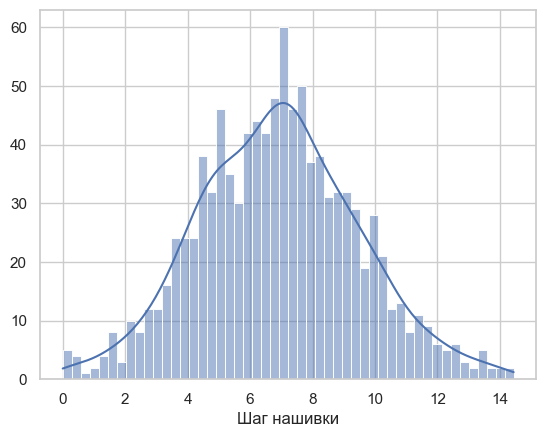

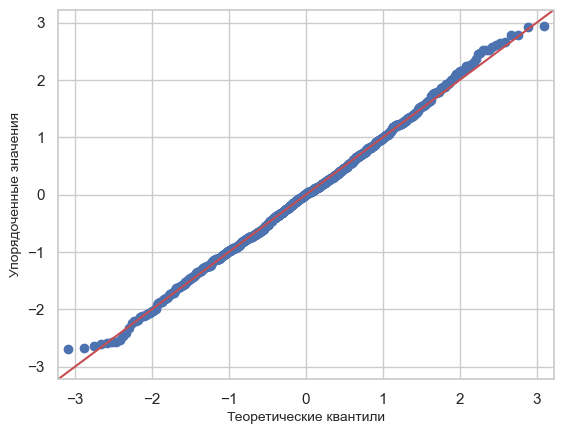

Для параметра Плотность нашивки
Mаксимальное значение: 103.988901301494
Минимальное значение 0.0
Среднее: 57.153929432857645
Стандартное отклонение: 12.344930681058155
Коэф. асимметрии (skewness): -0.22919818106745457
Коэф. эксцесса (kurtosis): 0.850635754756762
Критерий Шапиро-Уилка (Shapiro-Wilk): statistic=0.993310272693634, pvalue= 0.00014742391067557037
Нулевая гипотеза может быть отвергнута
Критерий Колмогорова-Смирнова (Kolmogorov): statistic=0.9990224828934506, pvalue= 0.0
Нулевая гипотеза может быть отвергнута
Критерий К-квадрата Д'Агостино (normaltest): statistic=[25.99172191], pvalue= [2.26970441e-06]
Нулевая гипотеза может быть отвергнута


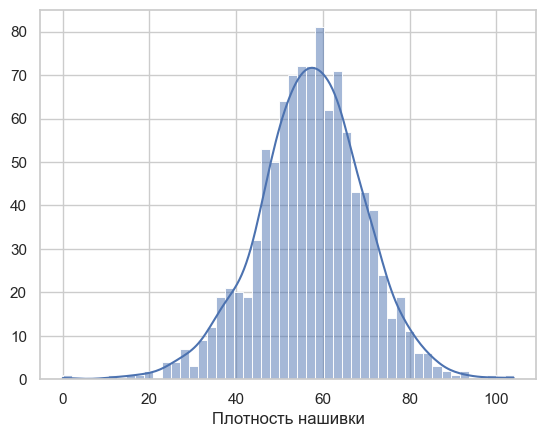

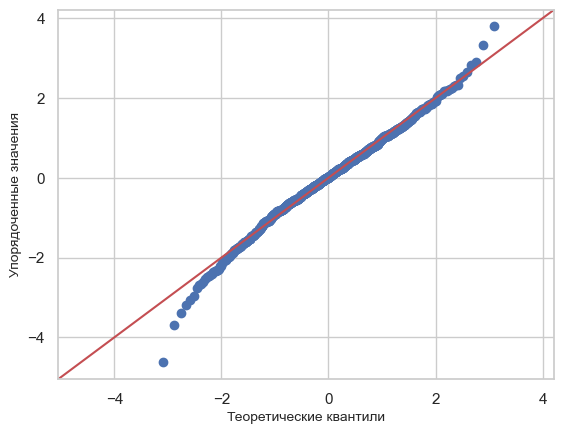

In [27]:
for i in df.columns:
  try:
    normality_tests(df[i])
  except:
    print(f'Error fo feature {i}')

Выводы:
- ни одно распределение не является истинно нормальным (Гауссовым);
- большинство распределений очень близки к нормальным;
- распределение по столбцам "Поверхностная плотность" и "Плотность нашивки" больше других отличаются от нормального, но стремятся к нему;
- почти во всех стобцах имеются выбросы/аномалии;
- столбец "Угол нашивки" имеет только два уникальных значения, другие не представлены, что объясняет характер распределения. Это, безусловно, повлияет на точность прогнозирования моделей. Однако, искусственное введение дополнительных данных без углубленных знаний предметной области прогноз лучше не сделает. Оставим признак непрерывным, впоследствии сделав его масштабирование;
- нормализация необходима для всех признаков, учитывая разницу в шкалах.

Для последующиего анализа целесообразно ориентироваться в большей степени на непараметрические статистические тесты.

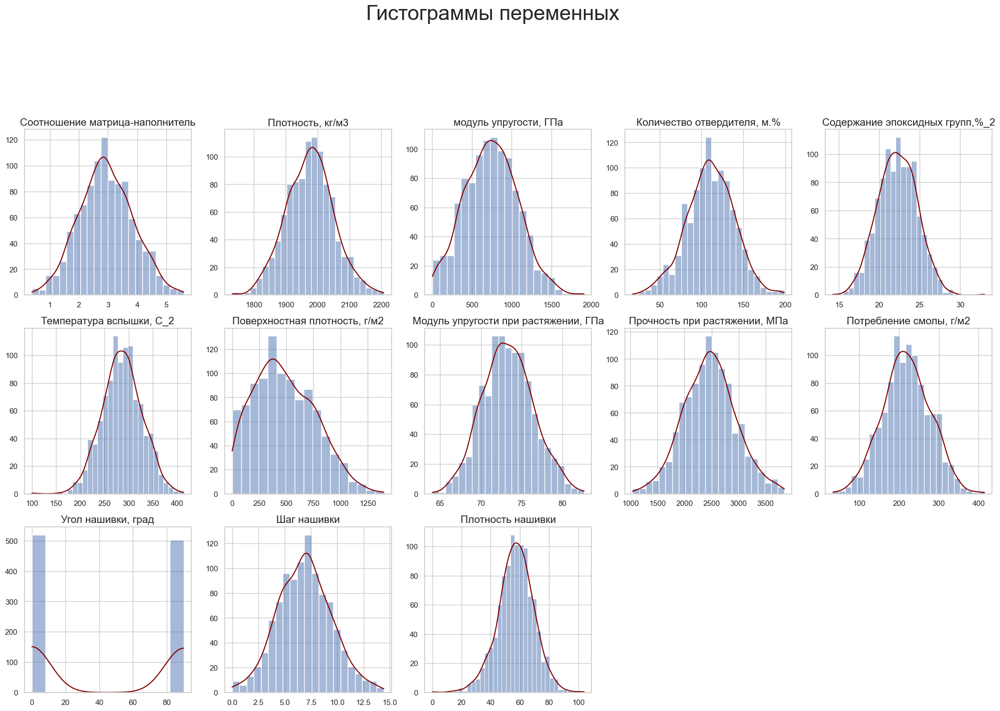

In [28]:
# выведем гистограммы распределений на один рисунок для единовременной визуализации 
columns = 5 # количество стобцов для распределения гистограмм
rows = 3 # количество рядов
hist_number = 1 # инициализируем счетчик гистограмм
plt.figure(figsize = (25,25))
plt.suptitle('Гистограммы переменных', fontsize = 30)
for col in df.columns:
    plt.subplot(columns, rows, hist_number)
    ax = sns.histplot(data = df, x = col, kde=True)
    ax.lines[0].set_color('maroon')
    plt.ylabel(None)
    plt.xlabel(None)
    plt.title(col, size = 15)
    hist_number += 1

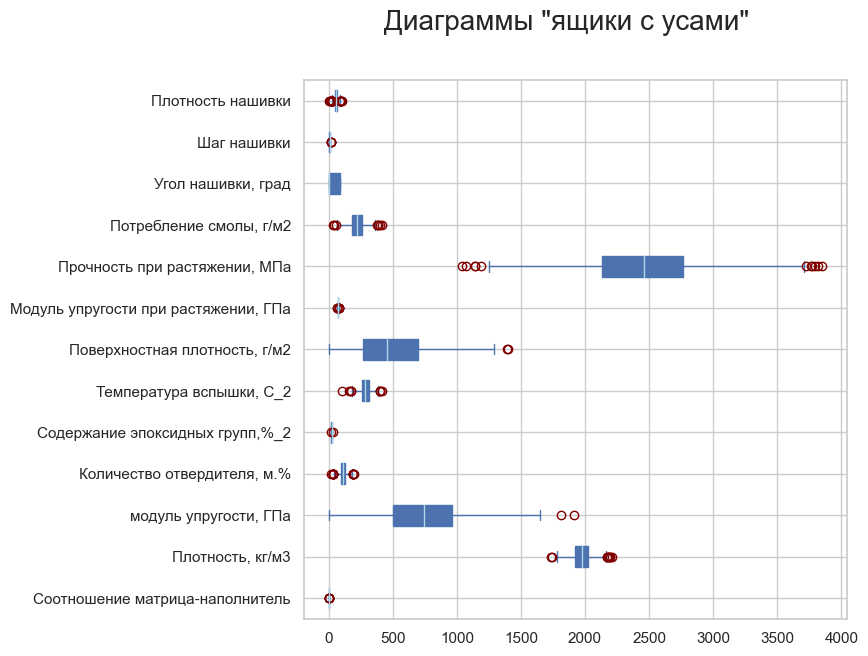

In [158]:
# используем диаграмму "ящик с усами" для более наглядной демонстрации необходимости нормализации данных и количества выбросов
plt.figure(figsize = (7, 7))
plt.suptitle('Диаграммы "ящики с усами"', fontsize = 20)
plt.boxplot(df, labels = df.columns, vert = False, patch_artist = True, meanline = True, boxprops = dict(facecolor = 'b', color = 'b'), \
            medianprops = dict(color = 'lightblue'), whiskerprops = dict(color = 'b'), capprops = dict(color = 'b'), flierprops = dict(markeredgecolor = 'maroon'))
plt.show()

#### Корреляционный анализ данных

/opt/homebrew/Caskroom/miniforge/base/envs/comproject/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


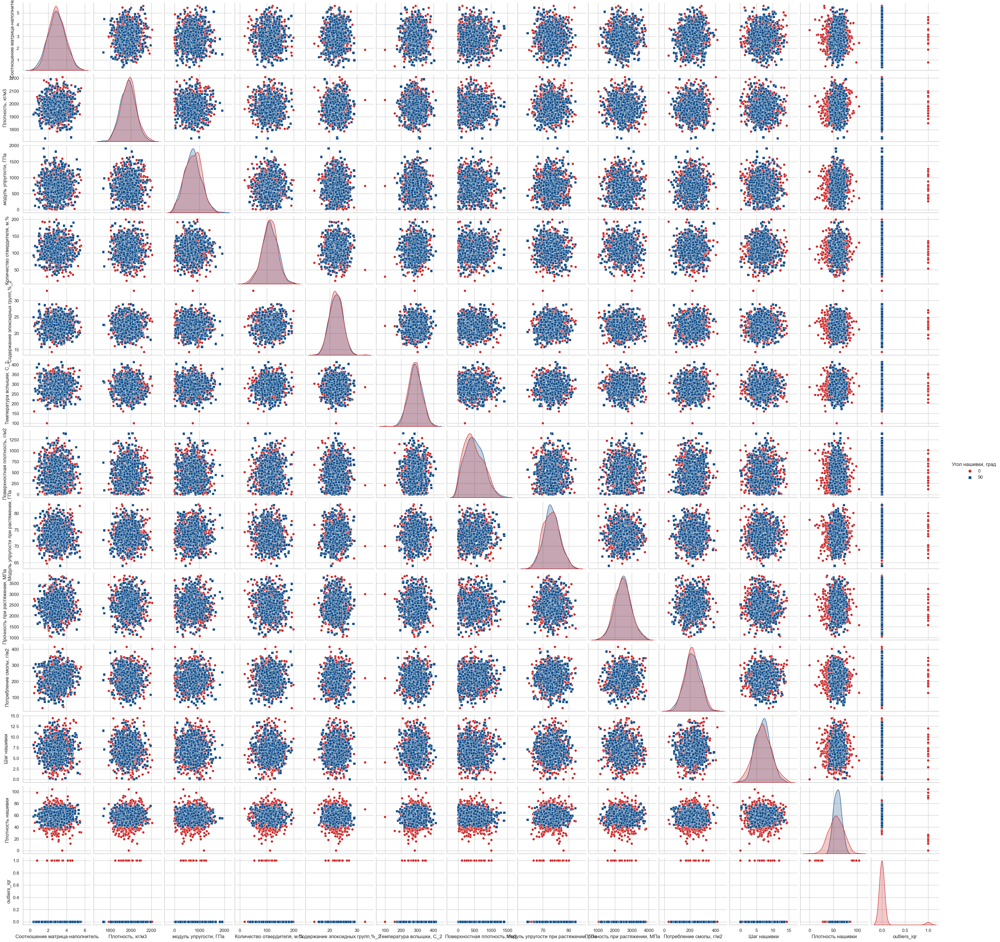

In [95]:
# оценим наличие взаимосвязей между переменными с помощью попарных графиков рассеяния точек (матрица диаграмм рассеяния) 
colors = ['#CD2626', '#104E8B']
custom_palette = sns.color_palette(colors) # создадим пользовательскую палитру 
sns.pairplot(df, hue = 'Угол нашивки, град', markers = ['o', 's'], diag_kind = 'auto', palette = custom_palette)

Выводы:
- линейной взаимосвязи между переменными не наблюдается;
- выбросы характерны для всех переменных, кроме столбца "Угол нашивки", где два уникальных значения.

In [29]:
# проведем корреляционный анализ
# учитывая близость к нормальному распределению почти для всех переменных для приблизительной оценки используем коэффициент корреляции Пирсона
df.corr(method='pearson')

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
Соотношение матрица-наполнитель,1.000000,0.003841,0.031700,-0.006445,0.019766,-0.004776,-0.006272,-0.008411,0.024148,0.072531,-0.031073,0.036437,-0.004652
"Плотность, кг/м3",0.003841,1.000000,-0.009647,-0.035911,-0.008278,-0.020695,0.044930,-0.017602,-0.069981,-0.015937,-0.068474,-0.061015,0.080304
"модуль упругости, ГПа",0.031700,-0.009647,1.000000,0.024049,-0.006804,0.031174,-0.005306,0.023267,0.041868,0.001840,-0.025417,-0.009875,0.056346
"Количество отвердителя, м.%",-0.006445,-0.035911,0.024049,1.000000,-0.000684,0.095193,0.055198,-0.065929,-0.075375,0.007446,0.038570,0.014887,0.017248
"Содержание эпоксидных групп,%_2",0.019766,-0.008278,-0.006804,-0.000684,1.000000,-0.009769,-0.012940,0.056828,-0.023899,0.015165,0.008052,0.003022,-0.039073
"Температура вспышки, С_2",-0.004776,-0.020695,0.031174,0.095193,-0.009769,1.000000,0.020121,0.028414,-0.031763,0.059954,0.020695,0.025795,0.011391
"Поверхностная плотность, г/м2",-0.006272,0.044930,-0.005306,0.055198,-0.012940,0.020121,1.000000,0.036702,-0.003210,0.015692,0.052299,0.038332,-0.049923
"Модуль упругости при растяжении, ГПа",-0.008411,-0.017602,0.023267,-0.065929,0.056828,0.028414,0.036702,1.000000,-0.009009,0.050938,0.023003,-0.029468,0.006476
"Прочность при растяжении, МПа",0.024148,-0.069981,0.041868,-0.075375,-0.023899,-0.031763,-0.003210,-0.009009,1.000000,0.028602,0.023398,-0.059547,0.019604
"Потребление смолы, г/м2",0.072531,-0.015937,0.001840,0.007446,0.015165,0.059954,0.015692,0.050938,0.028602,1.000000,-0.015334,0.013394,0.012239


Вывод:
- линейной корреляции не наблюдается: все коэффициенты близки к нулю.

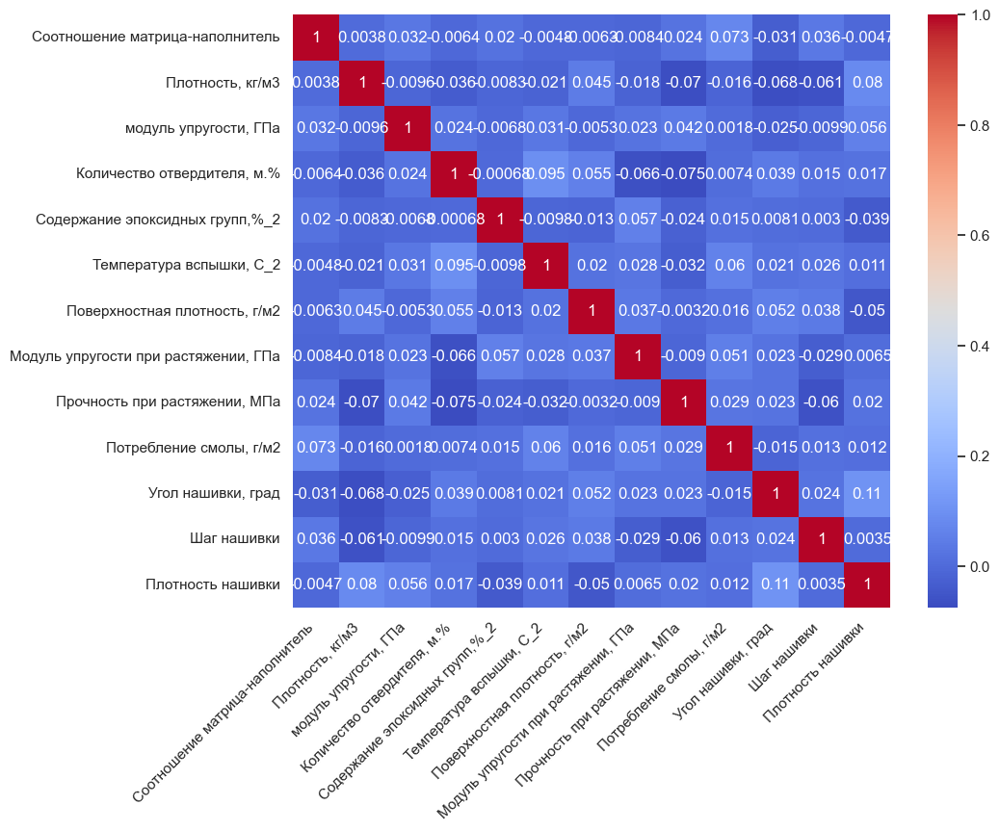

In [30]:
# визуализируем корреляционную матрицу с помощью тепловой карты
fig, ax = plt.subplots(figsize = (10, 8))
sns.heatmap(df.corr(method = 'pearson'), annot = True, cmap = 'coolwarm')
plt.xticks(rotation = 45, ha='right')
plt.show()

Выводы:
- действительно, линейной зависимости между переменными не наблюдается.

In [172]:
# учитывая наличие выбросов и характер распределения данных, для более точной оценки целесообразно использовать коэффициент рангов Кэндела
df.corr(method = 'kendall')

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
Соотношение матрица-наполнитель,1.000000,-0.003135,0.021247,0.001410,0.010180,-0.009480,-0.002060,-0.004157,0.011614,0.035145,-0.021395,0.022723,0.002788
"Плотность, кг/м3",-0.003135,1.000000,-0.008059,-0.021963,-0.007758,-0.019947,0.037302,-0.021151,-0.047426,-0.017079,-0.051525,-0.031220,0.052935
"модуль упругости, ГПа",0.021247,-0.008059,1.000000,0.022382,0.002351,0.021028,-0.000442,0.005458,0.022959,0.005169,-0.031695,-0.008305,0.049347
"Количество отвердителя, м.%",0.001410,-0.021963,0.022382,1.000000,0.000010,0.059034,0.033110,-0.043140,-0.046507,-0.003677,0.024690,0.006232,0.016607
"Содержание эпоксидных групп,%_2",0.010180,-0.007758,0.002351,0.000010,1.000000,-0.002170,-0.006859,0.041994,-0.013441,0.009756,0.004668,-0.004539,-0.021968
"Температура вспышки, С_2",-0.009480,-0.019947,0.021028,0.059034,-0.002170,1.000000,0.017196,0.016481,-0.019106,0.035313,0.017880,0.029552,0.005268
"Поверхностная плотность, г/м2",-0.002060,0.037302,-0.000442,0.033110,-0.006859,0.017196,1.000000,0.024051,-0.005099,-0.004446,0.045452,0.025514,-0.022320
"Модуль упругости при растяжении, ГПа",-0.004157,-0.021151,0.005458,-0.043140,0.041994,0.016481,0.024051,1.000000,-0.006599,0.034814,0.022431,-0.010024,-0.002600
"Прочность при растяжении, МПа",0.011614,-0.047426,0.022959,-0.046507,-0.013441,-0.019106,-0.005099,-0.006599,1.000000,0.013580,0.020609,-0.048049,0.009821
"Потребление смолы, г/м2",0.035145,-0.017079,0.005169,-0.003677,0.009756,0.035313,-0.004446,0.034814,0.013580,1.000000,-0.002402,0.005962,0.010792


Вывод:
- нелинейной корреляции также не наблюдается.

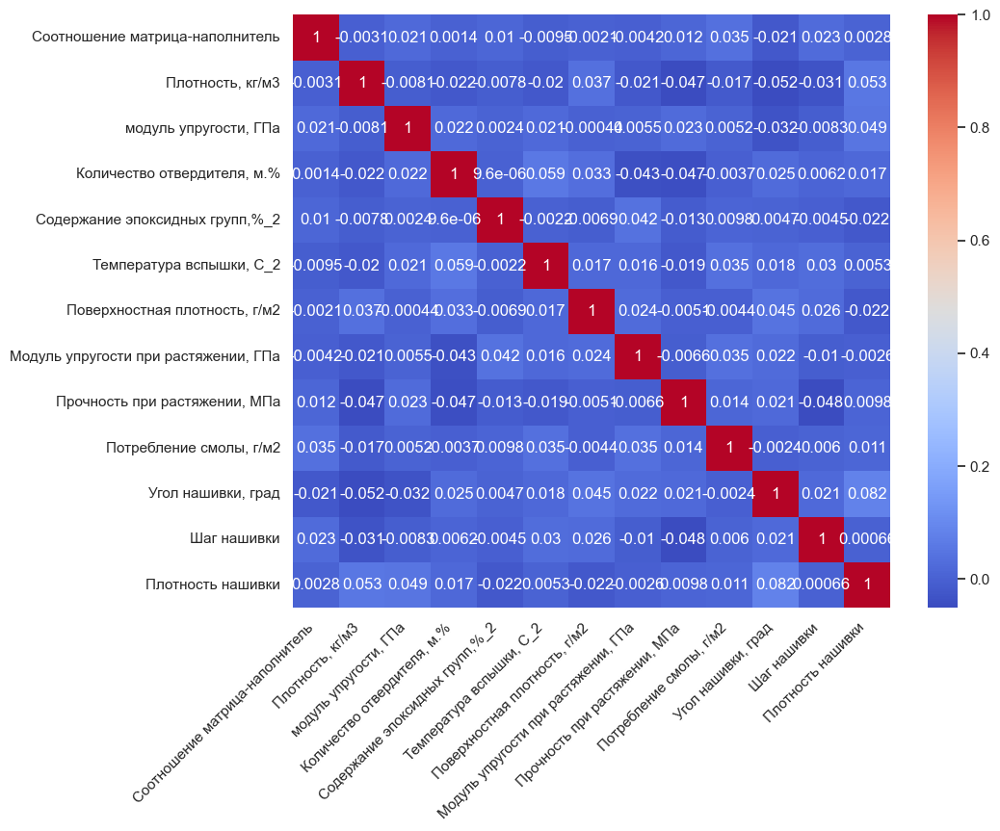

In [176]:
# визуализируем корреляционную матрицу с помощью тепловой карты
fig, ax = plt.subplots(figsize = (10, 8))
sns.heatmap(df.corr(method = 'kendall'), annot = True, cmap = 'coolwarm')
plt.xticks(rotation = 45, ha='right')
plt.show()

Вывод:
- взаимосвязи не наблюдается.

### Трансформация данных

#### Работа с выбросами

Для выявления выбросов в каждом из столбцов существует два способа:
- методом 3 сигм;
- межквартильного диапазона.

Выполним оба и сравним их результаты.

In [116]:
# посчитаем z-значения для переменных во всем наборе данных и сохраним их в отдельную таблицу
df_z = df.apply(stats.zscore)
df_z.head(3)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,-1.175779,0.736365,-0.003594,-2.848828,0.009757,-4.542215,-0.969964,-1.06772,1.098244,0.02641,-0.983518,-1.13153,-0.012469
1,-1.175779,0.736365,-0.003594,-2.141666,0.626001,-0.030955,-0.969964,-1.06772,1.098244,0.02641,-0.983518,-1.13153,0.230546
2,-1.175779,0.736365,-0.003594,-2.145202,4.471955,-0.030955,-0.969964,-1.06772,1.098244,0.02641,-0.983518,-1.13153,1.040595


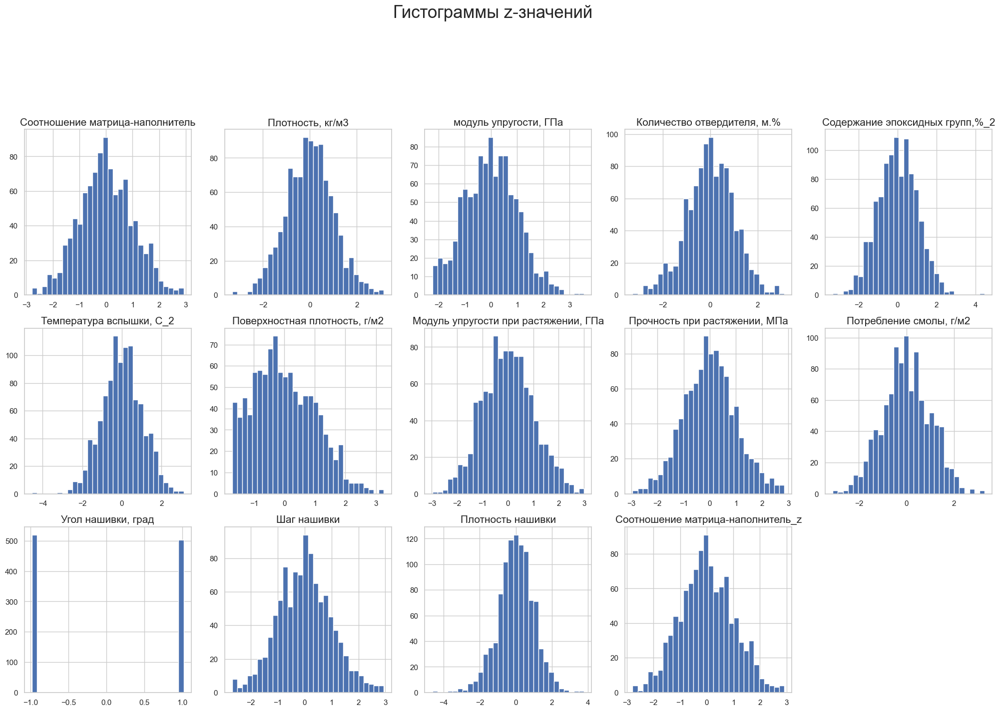

In [39]:
# визуализируем получившиеся распределения z-значений для примерной оценки количества выбросов
columns = 5 # количество стобцов для распределения гистограмм
rows = 3 # количество рядов
hist_number = 1 # инициализируем счетчик гистограмм
plt.figure(figsize = (25,25))
plt.suptitle('Гистограммы z-значений', fontsize = 25)
for col in df_z.columns:
    plt.subplot(columns, rows, hist_number)
    plt.hist(df_z[col], bins=30)
    plt.ylabel(None)
    plt.xlabel(None)
    plt.title(col, size = 15)
    hist_number += 1

Вывод:
больше всего значений за пределами интервала (-3;3) в стобцах "Модуль упругости", "Содержание эпоксидных групп", "Температура вспышки", "Поверхностная плотность", "Плотность нашивки"; следовательно, там количество выбросов будет больше.

Соотношение матрица-наполнитель : 0
Плотность, кг/м3 : 3
модуль упругости, ГПа : 2
Количество отвердителя, м.% : 2
Содержание эпоксидных групп,%_2 : 2
Температура вспышки, С_2 : 3
Поверхностная плотность, г/м2 : 2
Модуль упругости при растяжении, ГПа : 1
Прочность при растяжении, МПа : 0
Потребление смолы, г/м2 : 3
Угол нашивки, град : 0
Шаг нашивки : 0
Плотность нашивки : 7

 Общее количество выбросов: 25


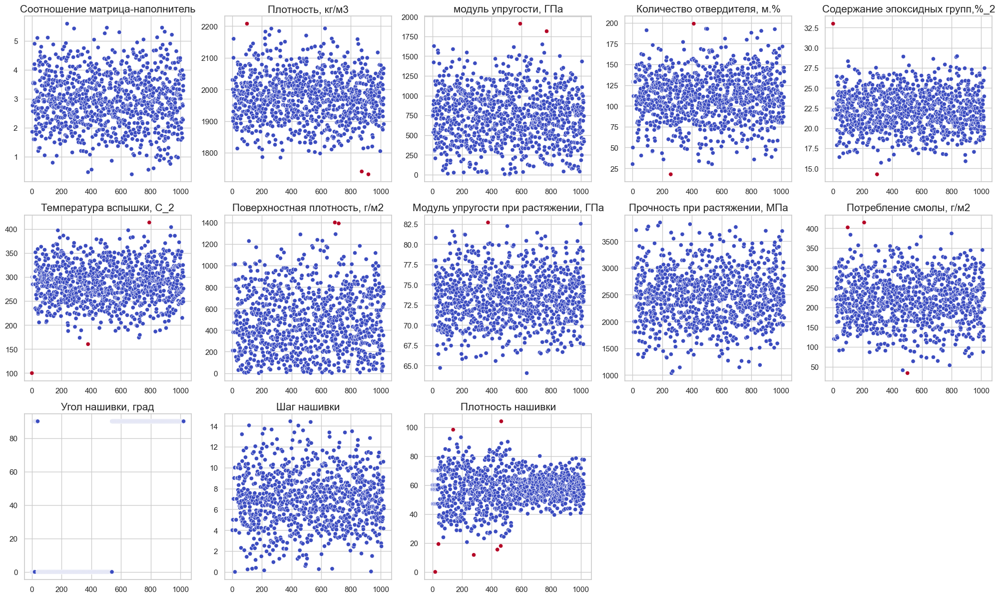

In [117]:
# подсчитаем количество выбросов, вычисленных методом 3-х сигм и визуализируем их (выбросы отметим красным)
method_3s = 0 # инициализируем переменную для подсчета общего количества выбросов
plt.figure(figsize = (25,25)) 
columns = 5 # количество стобцов для распределения графиков
rows = 3 # количество рядов
plot_number = 1 # инициализируем счетчик графиков
for column in df_z.columns:
    outliers = sum((abs(df_z[column])) > 3)
    print(column, ':', outliers)
    method_3s += outliers
    plt.subplot(columns, rows, plot_number)
    color = ((abs(df_z[column])) > 3).astype(int)
    sns.scatterplot(x = df.index, y = df[column], c=color, cmap='coolwarm')
    plt.ylabel(None)
    plt.xlabel(None)
    plt.title(column, size = 15)
    plot_number += 1
print('\n', 'Общее количество выбросов:', method_3s)

Соотношение матрица-наполнитель : 6
Плотность, кг/м3 : 9
модуль упругости, ГПа : 2
Количество отвердителя, м.% : 14
Содержание эпоксидных групп,%_2 : 2
Температура вспышки, С_2 : 8
Поверхностная плотность, г/м2 : 2
Модуль упругости при растяжении, ГПа : 6
Прочность при растяжении, МПа : 11
Потребление смолы, г/м2 : 8
Угол нашивки, град : 0
Шаг нашивки : 4
Плотность нашивки : 21

 Общее количество выбросов: 93


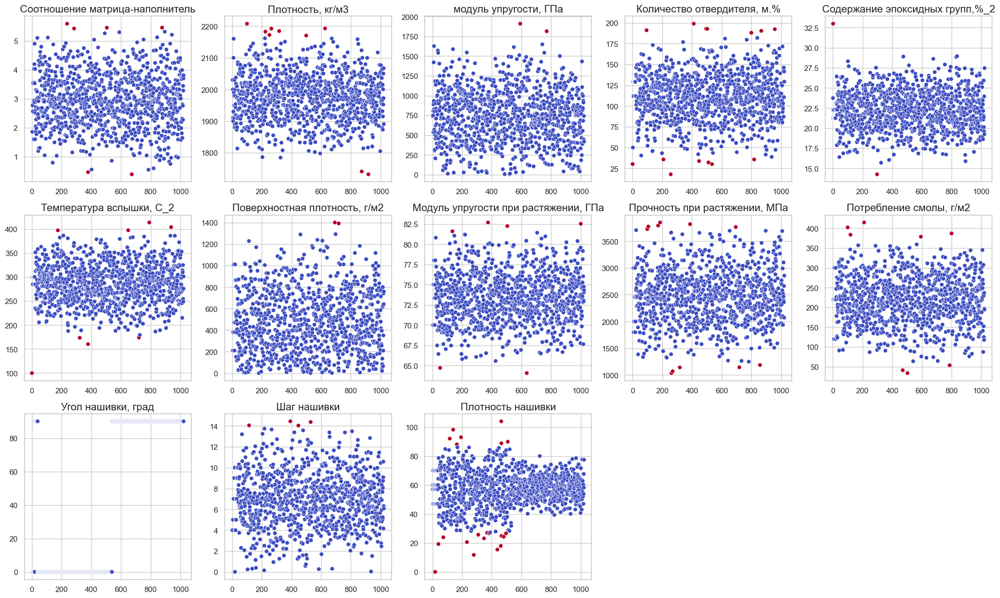

In [118]:
# подсчитаем количество выбросов, вычисленных методом межквартильного диапазона 
# визуализируем выбросы (отмечены красным на графиках) для последующего выбора оптимального решения
method_iqr = 0
plt.figure(figsize = (25,25)) 
columns = 5 # количество стобцов для распределения графиков
rows = 3 # количество рядов
plot_number = 1 # инициализируем счетчик графиков
for column in df.columns:
    q1 = df[column].quantile(0.25)
    q3 = df[column].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    df['outliers_iqr'] = (df[column] <= lower_bound) | (df[column] >= upper_bound)
    print(column, ':', df['outliers_iqr'].sum())
    plt.subplot(columns, rows, plot_number)
    color = df['outliers_iqr'].astype(int)
    sns.scatterplot(x = df.index, y = df[column], c=color, cmap='coolwarm')
    plt.ylabel(None)
    plt.xlabel(None)
    plt.title(column, size = 15)
    plot_number += 1
    method_iqr += df['outliers_iqr'].sum()
print('\n', 'Общее количество выбросов:', method_iqr)

Выводы:
- количество выбросов больше в случае выбора метода межквартильного диапазона;
- судя по графикам, значения, отмеченные как выбросы, при использования метода межквартильного диапазона выглядят логичнее (метод 3х сигм практически ничего не выделил).

В последующей работе будем использовать датасет, полученный в результате выделения выбросов методом межквартильного диапазона.

Выбросы предлагается заменить на верхний и нижний предельные значения с целью сохранения данных и отсутствием глубинных знаний в предметной области и, следовательно, низкой информативностью их выделения в отдельную таблицу. 

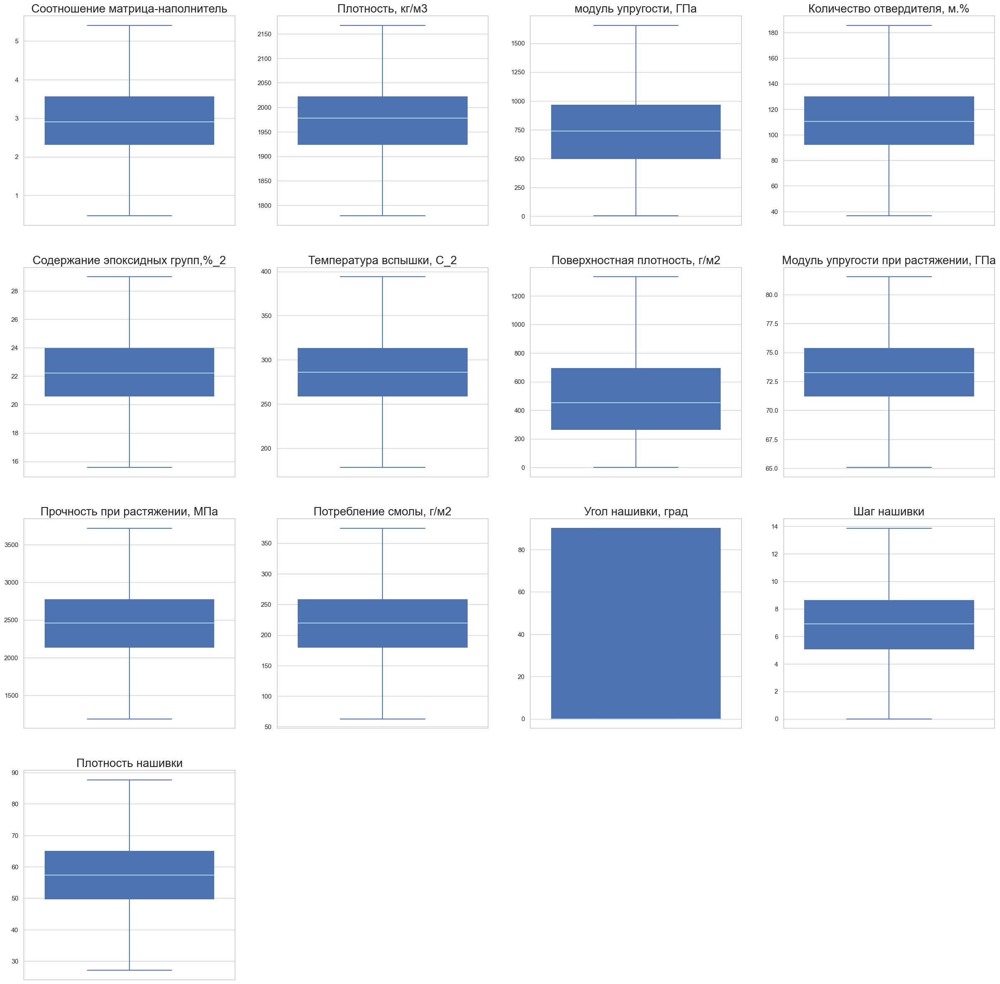

In [100]:
# заменим выбросы во всех столбцах, где они есть, на верхние и нижние предельные значения
# визуализируем результат для каждого из столбцов с помощью "ящика с усами"
plt.figure(figsize = (30,30)) 
columns = 4 # количество стобцов для распределения графиков
rows = 4 # количество рядов
plot_number = 1 # инициализируем счетчик графиков
for column in df.columns:
    q1 = df[column].quantile(0.25)
    q3 = df[column].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    df[column] = np.where(df[column] > upper_bound, upper_bound, np.where(df[column] < lower_bound, lower_bound, df[column]))
    plt.subplot(rows, columns, plot_number)
    sns.boxplot(data=df, y = df[column], meanline = True, boxprops = dict(facecolor = 'b', color = 'b'), \
            medianprops = dict(color = 'lightblue'), whiskerprops = dict(color = 'b'), capprops = dict(color = 'b'), flierprops = dict(markeredgecolor = 'maroon'))
    plt.ylabel(None)
    plt.xlabel(None)
    plt.title(column, size = 20)
    plot_number += 1

Вывод:
результат удовлетворительный, выбросов нет.

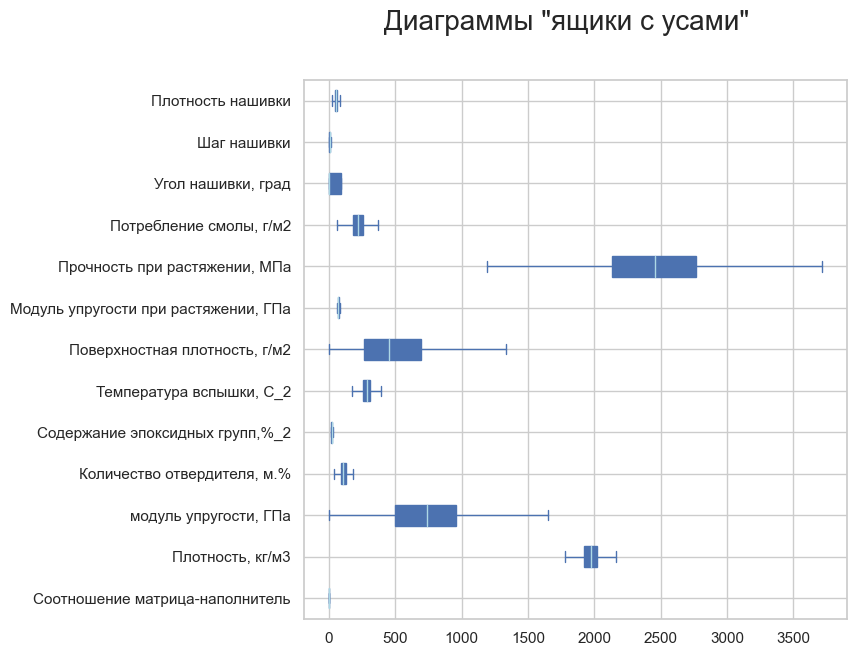

In [15]:
# повторно выведем диаграммы "ящики с усами" для всех переменных на одном рисунке
plt.figure(figsize = (7, 7))
plt.suptitle('Диаграммы "ящики с усами"', fontsize = 20)
plt.boxplot(df, labels = df.columns, vert = False, patch_artist = True, meanline = True, boxprops = dict(facecolor = 'b', color = 'b'), \
            medianprops = dict(color = 'lightblue'), whiskerprops = dict(color = 'b'), capprops = dict(color = 'b'), flierprops = dict(markeredgecolor = 'maroon'))
plt.show()

Вывод:
трудности в визуализации некоторых диаграмм объясняются значительными различиями в шкалах измерения переменных, что свидетельствует о необходимости нормализации данных.

In [174]:
# сохраним датасет без выбросов для последующего быстрого доступа, при необходимости
df_clean = df.to_csv('/Users/kusita_1/Desktop/df compositum clean.csv')

#### Нормализация данных

In [53]:
# Следующим этапом для приведения данных к единой шкале будет нормализация.
# Учитывая, что все данные - положительные числа, первоначально используем для нормализации MinMaxScaler().
min_max_scaler = preprocessing.MinMaxScaler()
df_min_max_scaled = min_max_scaler.fit_transform(df)
df_min_max_scaled = pd.DataFrame(df_min_max_scaled, columns=df.columns)
# проверим получившуюся после нормализации таблицу
df_min_max_scaled.head(3)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0.281715,0.647181,0.445696,0.000000,0.498723,0.000000,0.157177,0.299298,0.717187,0.504641,0.0,0.288899,0.493858
1,0.281715,0.647181,0.445696,0.090426,0.609202,0.493423,0.157177,0.299298,0.717187,0.504641,0.0,0.288899,0.543377
2,0.281715,0.647181,0.445696,0.089755,1.000000,0.493423,0.157177,0.299298,0.717187,0.504641,0.0,0.288899,0.708440


In [36]:
# выведем описательную статистику
df_min_max_scaled.describe().T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,1023.0,0.498961,0.184685,0.0,0.375000,0.494251,0.625000,1.0
"Плотность, кг/м3",1023.0,0.507517,0.188037,0.0,0.375000,0.512489,0.625000,1.0
"модуль упругости, ГПа",1023.0,0.446166,0.199125,0.0,0.301213,0.446257,0.580728,1.0
"Количество отвердителя, м.%",1023.0,0.496502,0.188096,0.0,0.375000,0.496499,0.625000,1.0
"Содержание эпоксидных групп,%_2",1023.0,0.496778,0.178004,0.0,0.375000,0.495957,0.625000,1.0
"Температура вспышки, С_2",1023.0,0.499610,0.187706,0.0,0.375000,0.499363,0.625000,1.0
"Поверхностная плотность, г/м2",1023.0,0.361803,0.210872,0.0,0.199824,0.338725,0.519895,1.0
"Модуль упругости при растяжении, ГПа",1023.0,0.501596,0.188924,0.0,0.375000,0.498054,0.625000,1.0
"Прочность при растяжении, МПа",1023.0,0.506070,0.191467,0.0,0.375000,0.503169,0.625000,1.0
"Потребление смолы, г/м2",1023.0,0.499469,0.190439,0.0,0.375000,0.502069,0.625000,1.0


Вывод: 
нормализация проведена успешно: данные находятся в диапазоне от 0 до 1.

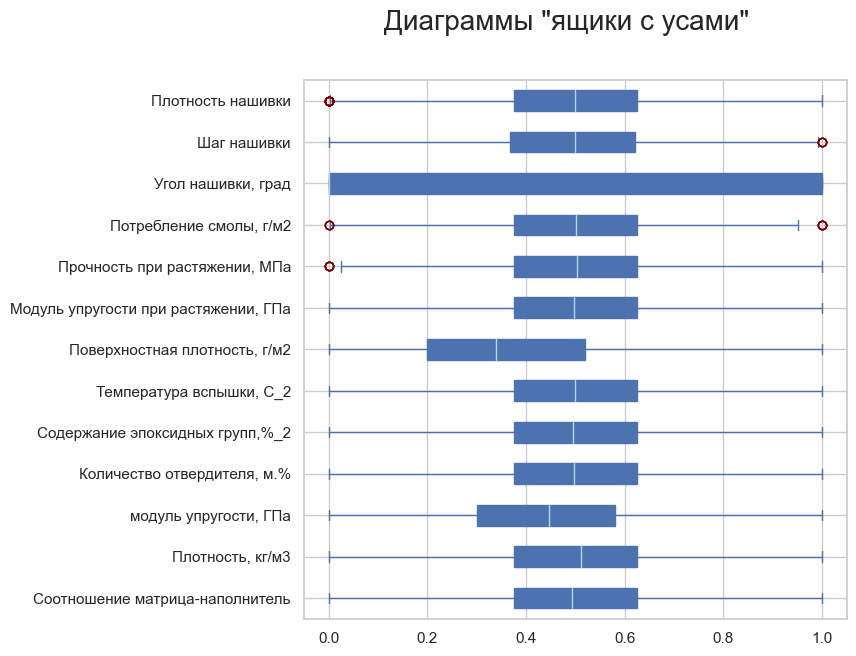

In [54]:
# используем диаграммы "ящик с усами" для наглядной демонстрации изменений
plt.figure(figsize = (7, 7))
plt.suptitle('Диаграммы "ящики с усами"', fontsize = 20)
plt.boxplot(df_min_max_scaled, labels = df.columns, vert = False, patch_artist = True, meanline = True, boxprops = dict(facecolor = 'b', color = 'b'), \
            medianprops = dict(color = 'lightblue'), whiskerprops = dict(color = 'b'), capprops = dict(color = 'b'), flierprops = dict(markeredgecolor = 'maroon'))
plt.show()

Появившиеся выбросы не являются аномалиями, так как связаны с изменением масштаба. В связи с этим исправлять их не будем.

In [179]:
# посмотрим распределение каждой из переменных после нормализации
# отдельно выведем среднее, медианное, минимальное и максимальое значения для каждой переменной
# напишем функцию для удобства выведения информации
def distribution(data):
  """Для переменной, подаваемой в качестве параметра в виде одномерной структуры данных:
  - печатает максимальное и минимальное значения;
  - рассчитывает и печатает среднее и медианное значения;
  - строит гистограмму c кривой ядерной оценки плотности;
  - строит квантиль-квантиль график."""
  print('\033[1m' + f'Для параметра {i}')
  print('\033[0m', end='')
  print('Mаксимальное значение:', np.max(data))
  print('Минимальное значение', np.min(data))
  print('Среднее:', np.mean(data))
  print('Медиана:', np.median(data))
  sns.histplot(data, bins = 50, kde=True)
  plt.ylabel(None)
  fig = sm.qqplot(data, line='45', fit=True)
  plt.xlabel('Теоретические квантили', fontsize = 10)
  plt.ylabel('Упорядоченные значения', fontsize = 10)
  plt.show()
  

Для параметра Соотношение матрица-наполнитель
Mаксимальное значение: 1.0
Минимальное значение 0.0
Среднее: 0.49896138770062787
Медиана: 0.49425084319671964


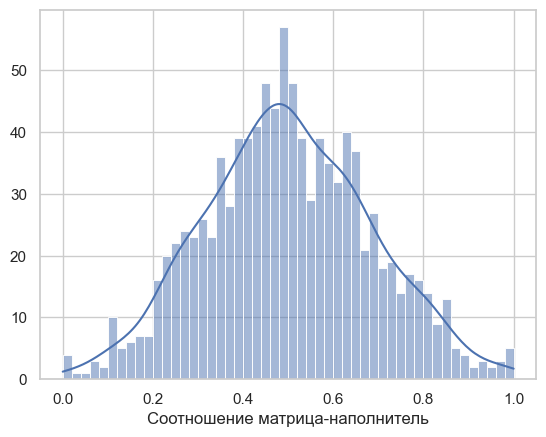

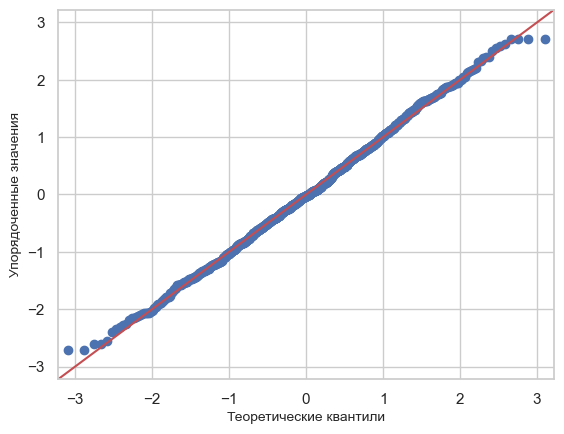

Для параметра Плотность, кг/м3
Mаксимальное значение: 1.0
Минимальное значение 0.0
Среднее: 0.5075166797630328
Медиана: 0.5124891757467145


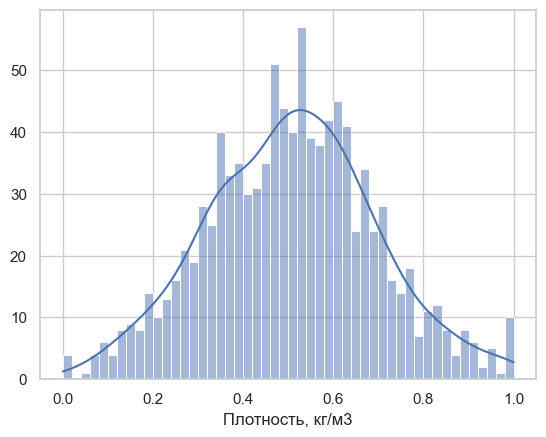

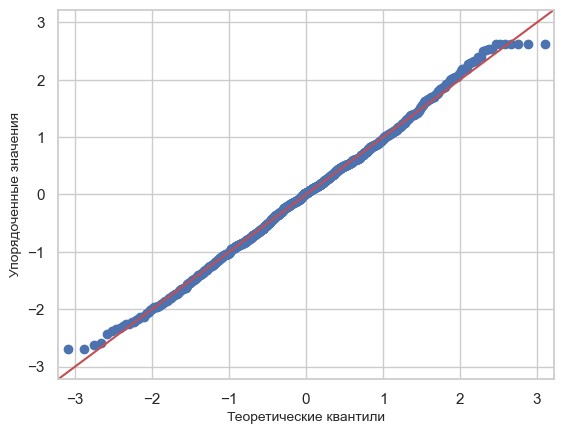

Для параметра модуль упругости, ГПа
Mаксимальное значение: 0.9999999999999999
Минимальное значение 0.0
Среднее: 0.44616639645258566
Медиана: 0.44625729568252515


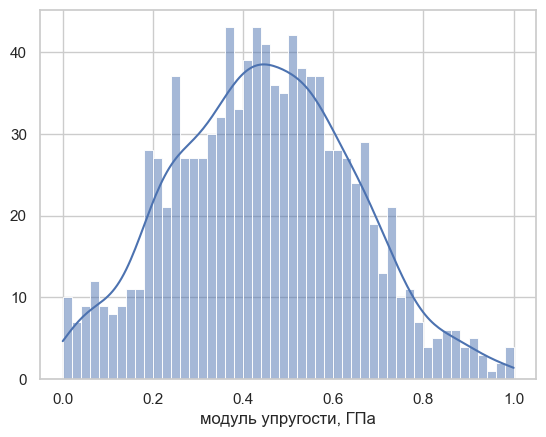

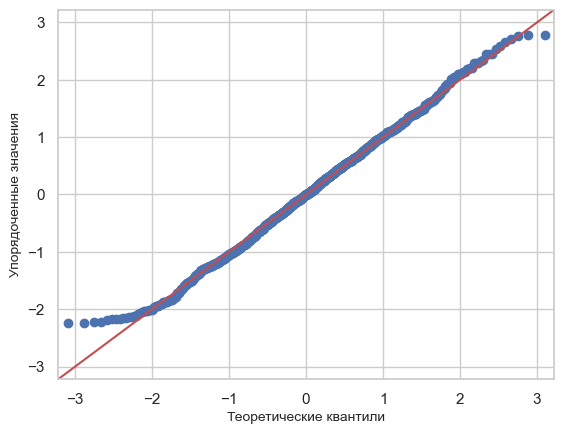

Для параметра Количество отвердителя, м.%
Mаксимальное значение: 1.0
Минимальное значение 0.0
Среднее: 0.49650248189109625
Медиана: 0.4964994935810569


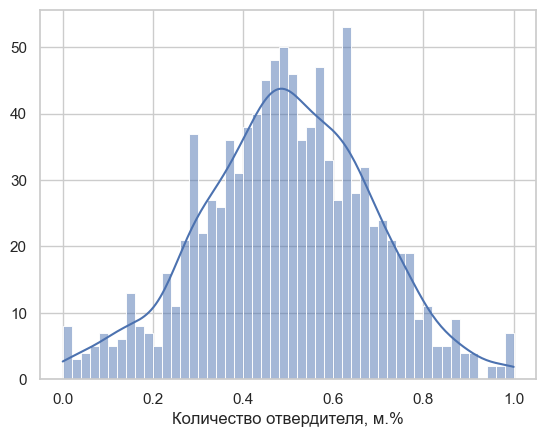

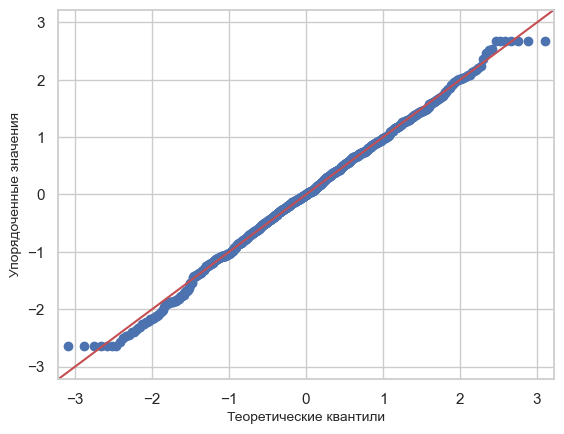

Для параметра Содержание эпоксидных групп,%_2
Mаксимальное значение: 1.0
Минимальное значение 0.0
Среднее: 0.49677844265348664
Медиана: 0.49595692569633365


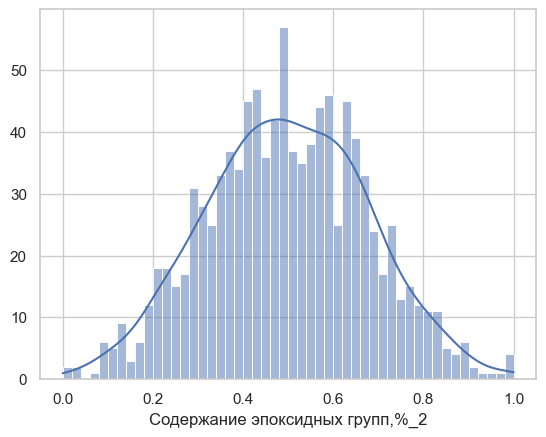

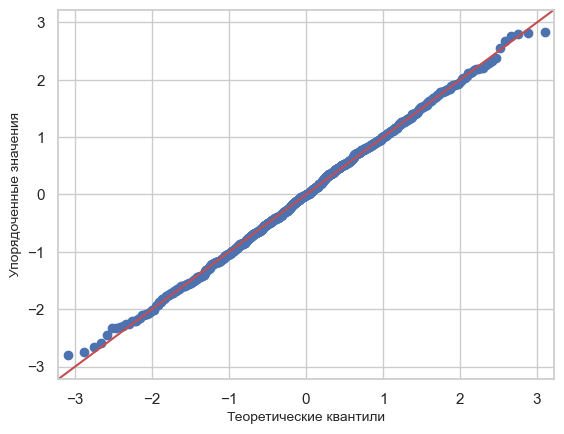

Для параметра Температура вспышки, С_2
Mаксимальное значение: 1.0
Минимальное значение 0.0
Среднее: 0.4996099712787588
Медиана: 0.4993626454749136


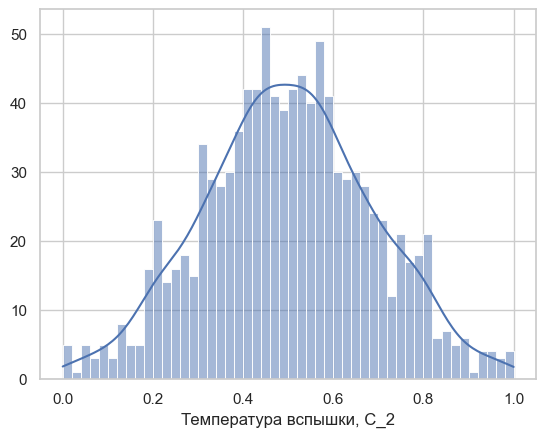

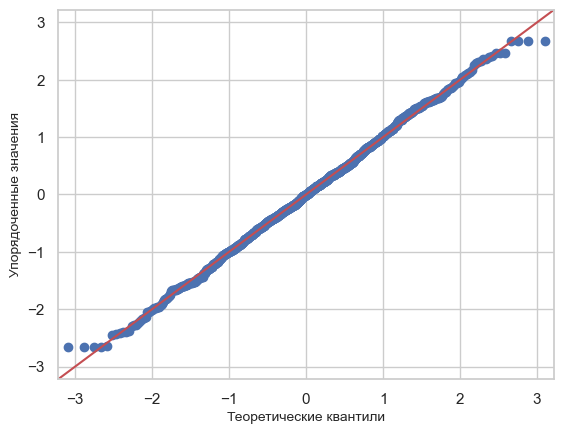

Для параметра Поверхностная плотность, г/м2
Mаксимальное значение: 1.0
Минимальное значение 0.0
Среднее: 0.36180285243986404
Медиана: 0.33872478946570556


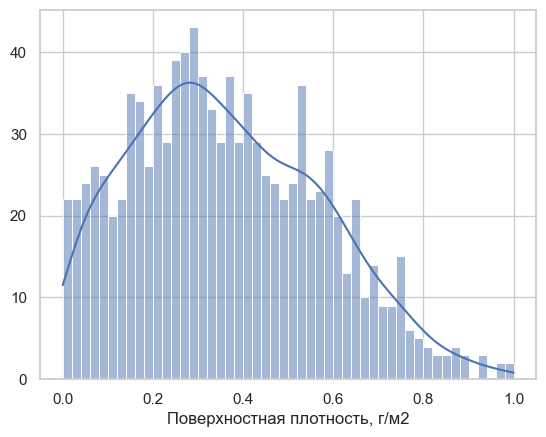

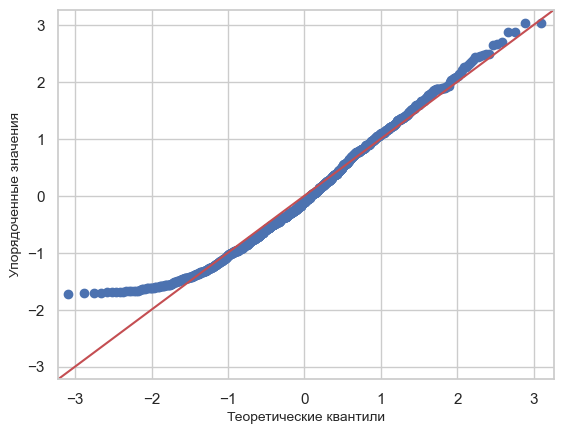

Для параметра Модуль упругости при растяжении, ГПа
Mаксимальное значение: 0.9999999999999996
Минимальное значение 0.0
Среднее: 0.5015961747240536
Медиана: 0.49805363739489694


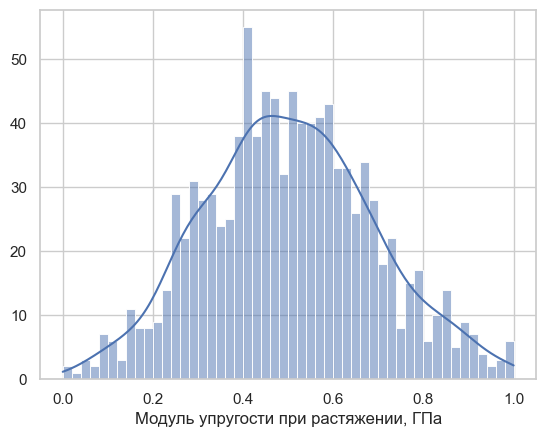

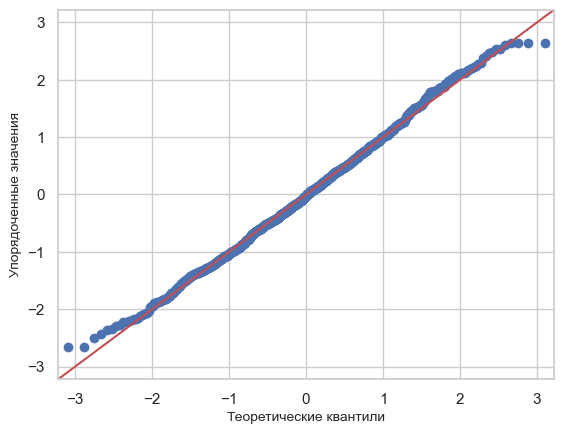

Для параметра Прочность при растяжении, МПа
Mаксимальное значение: 1.0
Минимальное значение 0.0
Среднее: 0.5060700040644854
Медиана: 0.5031689376810242


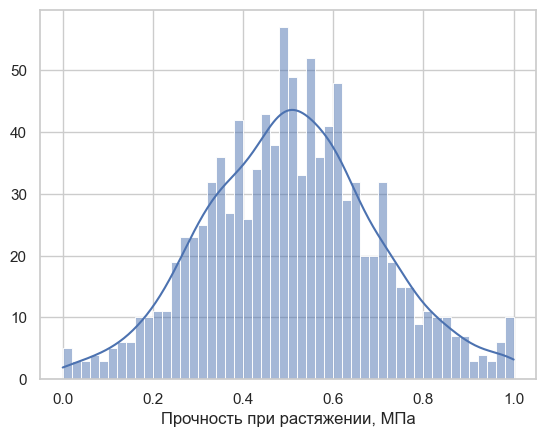

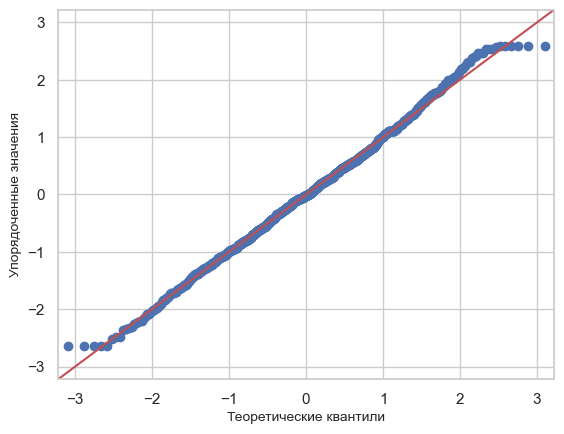

Для параметра Потребление смолы, г/м2
Mаксимальное значение: 1.0000000000000002
Минимальное значение 0.0
Среднее: 0.49946912120842285
Медиана: 0.5020688030301497


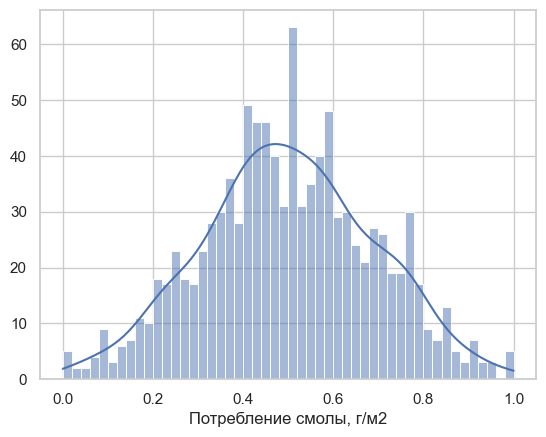

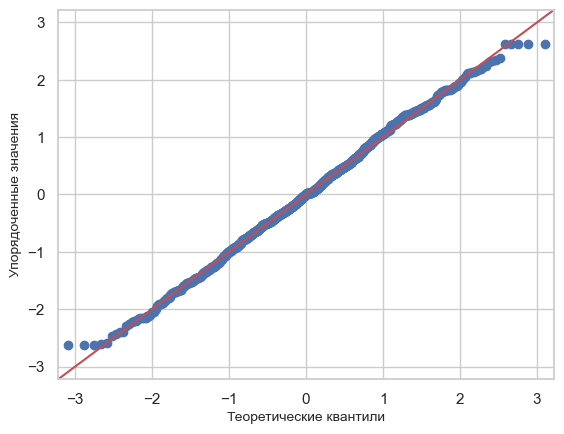

Для параметра Угол нашивки, град
Mаксимальное значение: 1.0
Минимальное значение 0.0
Среднее: 0.4916911045943304
Медиана: 0.0


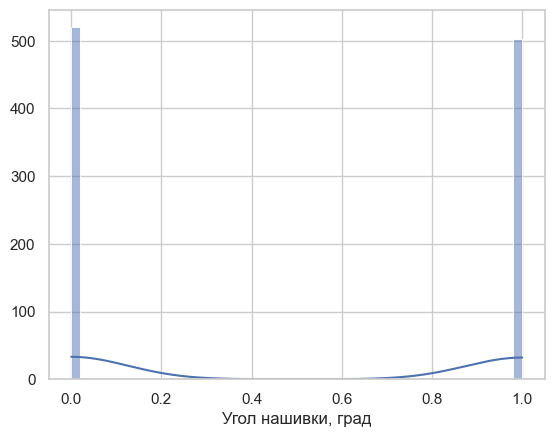

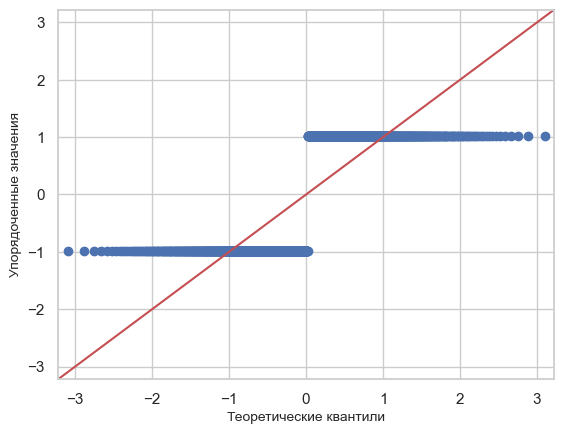

Для параметра Шаг нашивки
Mаксимальное значение: 1.0
Минимальное значение 0.0
Среднее: 0.4981868800102608
Медиана: 0.49951628153378075


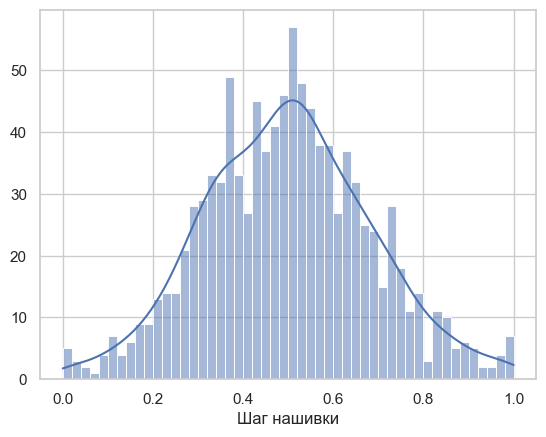

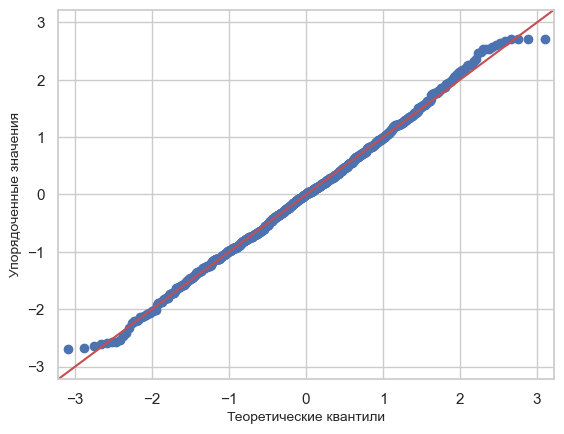

Для параметра Плотность нашивки
Mаксимальное значение: 0.9999999999999998
Минимальное значение 0.0
Среднее: 0.49723502716579676
Медиана: 0.49950205820182997


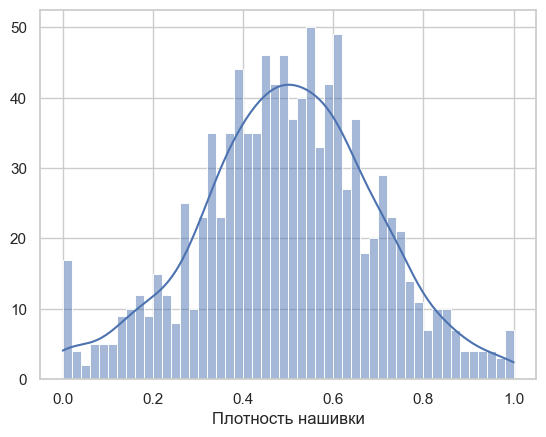

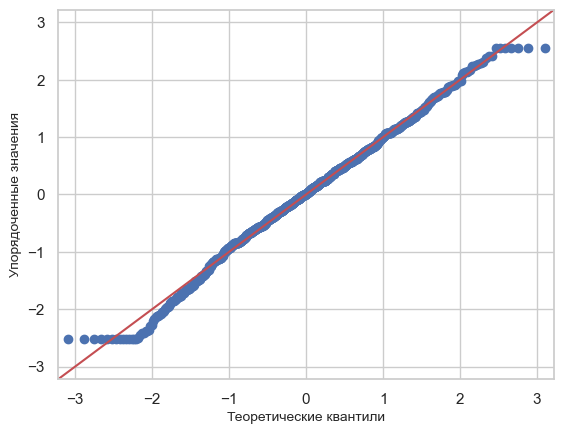

In [180]:
for i in df_min_max_scaled.columns:
  try:
    distribution(df_min_max_scaled[i])
  except:
    print(f'Error fo feature {i}')

Как следовало ожидать, характер распределения данных не изменился.

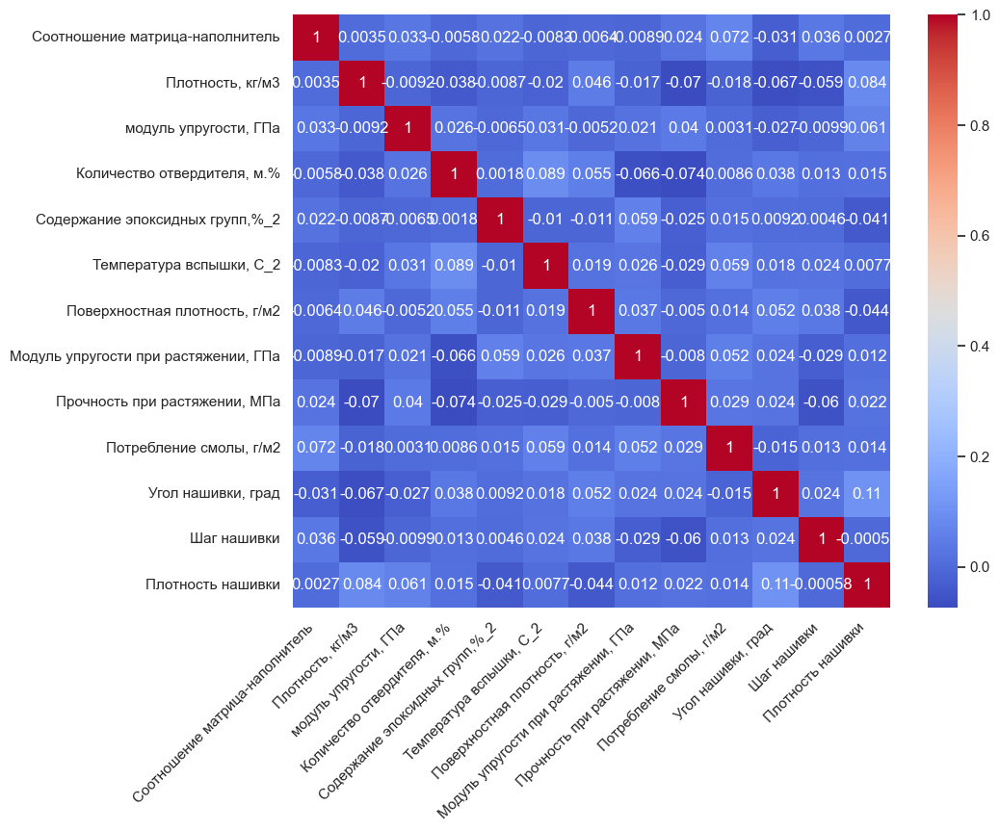

In [181]:
# посмотрим появились ли скрытые ранее взаимосвязи между переменными с помощью расчета коэффициентов корреляции Пирсона и обозначения их на тепловой карте
fig, ax = plt.subplots(figsize = (10, 8))
sns.heatmap(df_min_max_scaled.corr(method = 'pearson'), annot = True, cmap = 'coolwarm')
plt.xticks(rotation = 45, ha='right')
plt.show()

Вывод:
линейная корреляция не просматривается. 

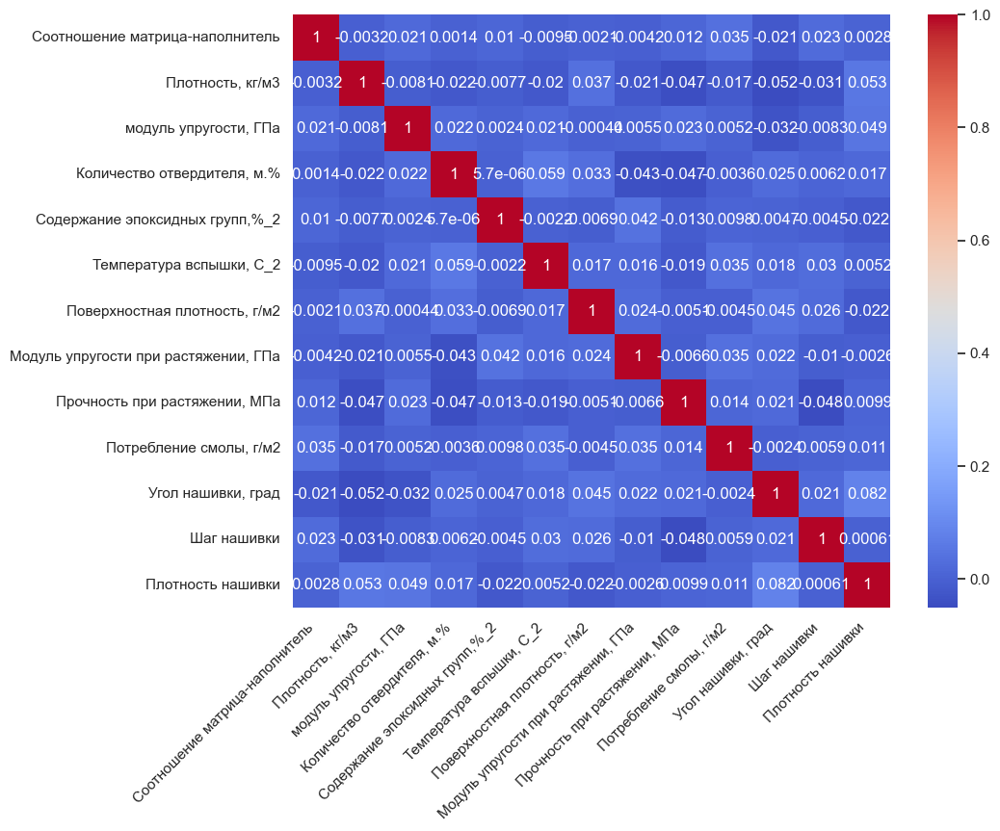

In [182]:
# посмотрим появились ли скрытые ранее взаимосвязи между переменными с помощью расчета коэффициентов рангов Кэндела и обозначения их на тепловой карте
fig, ax = plt.subplots(figsize = (10, 8))
sns.heatmap(df_min_max_scaled.corr(method = 'kendall'), annot = True, cmap = 'coolwarm')
plt.xticks(rotation = 45, ha='right')
plt.show()

Вывод:
нелинейной взаимосвязи не отмечается.

In [189]:
# сохраним нормализованную с помощью MinMaxScaler таблицу в отдельный файл для удобства доступа впоследствии
df_min_max_scaled = df_min_max_scaled.to_csv('/Users/kusita_1/Desktop/df compositum minmax scaled.csv')

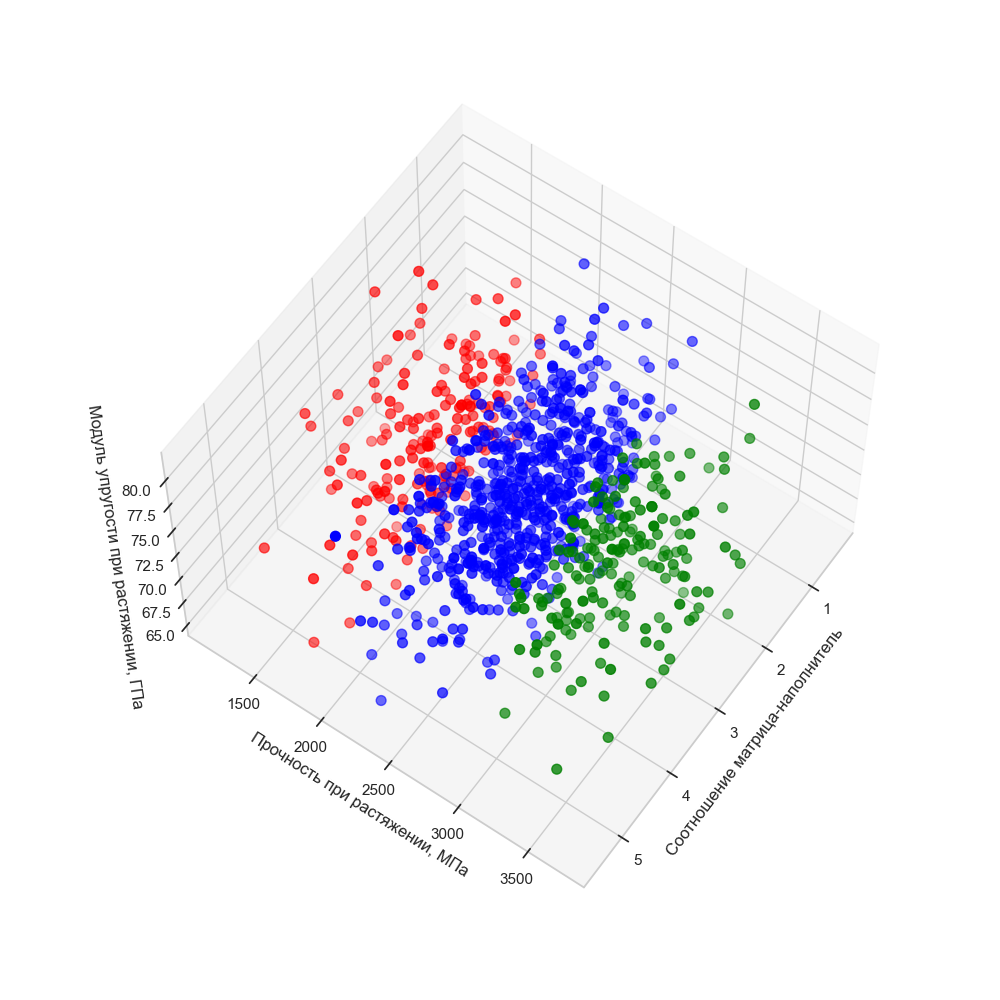

In [55]:
# попробуем найти закономерности в данных с помощью 3D визуализации
# первоначально посмотрим на расположение зависимых переменных
# для интерактивной работы в Google Colab необходим запуск двух последующих строк
#from google.colab import output
#output.enable_custom_widget_manager()
# сделаем возможной интерактивную визуализацию
%matplotlib widget 
observation_colormap = ListedColormap (["red","blue","green"]) # определим цвета для переменных
fig = plt.figure(figsize = (10, 10))
ax = fig.add_subplot(111, projection = "3d")
x = np.array(df["Соотношение матрица-наполнитель"])
z = np.array(df["Модуль упругости при растяжении, ГПа"])
y = np.array(df["Прочность при растяжении, МПа"])
ax.scatter(x, y, z, c = (x + y + z), cmap=observation_colormap, s=50)
ax.set_xlabel("Соотношение матрица-наполнитель")
ax.set_ylabel("Прочность при растяжении, МПа")
ax.set_zlabel("Модуль упругости при растяжении, ГПа")
ax.view_init(60, 35); # повернем угол обзора для лучшей визуализации границ между переменными

Вывод:
при повороте рисунка видно, что данные прекрасно отделимы друг от друга, хотя на графиках 2D они смешивались и казались одним "облаком".

Попробуем найти паттерны проекций данных с помощью ядерного метода главных компонент для нелинейного отображения.

In [60]:
# столбец "Угол нашивки" имеет только два уникальных значения и потому не может быть использован при анализе главных компонент
# создадим отдельную таблицу без этого столбца 
df_no_angle = df_min_max_scaled.drop('Угол нашивки, град', axis = 1)
df_no_angle.head(3)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки
0,0.281715,0.647181,0.445696,0.000000,0.498723,0.000000,0.157177,0.299298,0.717187,0.504641,0.288899,0.493858
1,0.281715,0.647181,0.445696,0.090426,0.609202,0.493423,0.157177,0.299298,0.717187,0.504641,0.288899,0.543377
2,0.281715,0.647181,0.445696,0.089755,1.000000,0.493423,0.157177,0.299298,0.717187,0.504641,0.288899,0.708440


<Figure size 3000x3000 with 0 Axes>

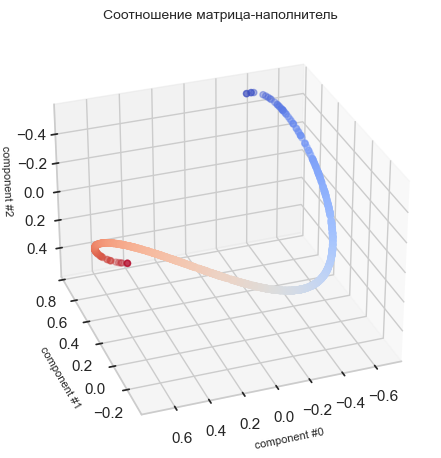

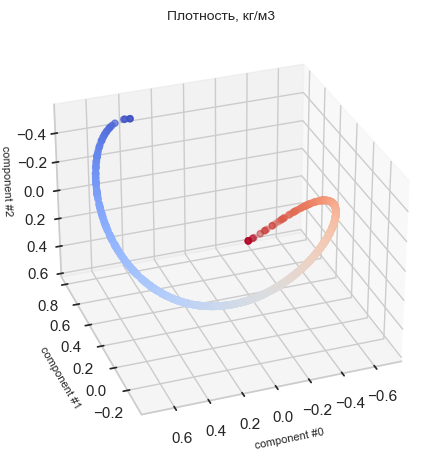

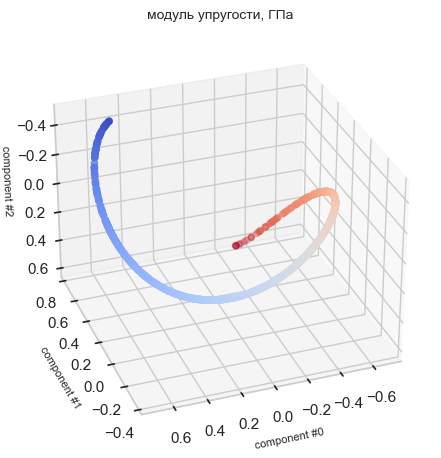

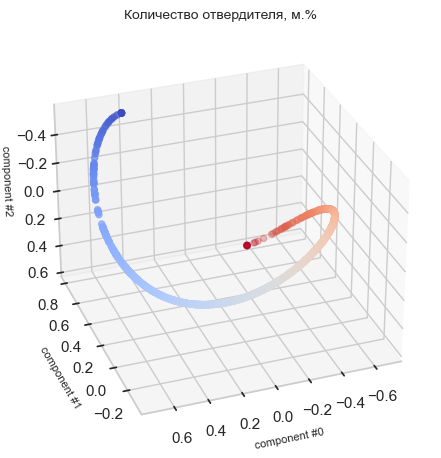

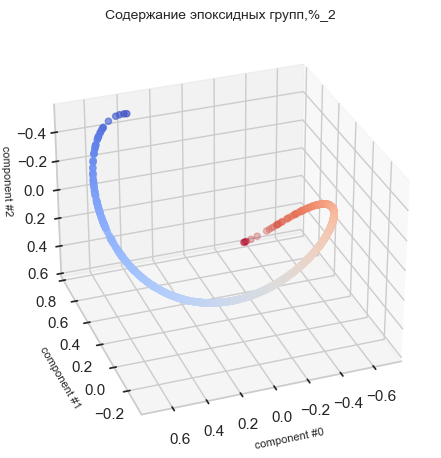

...

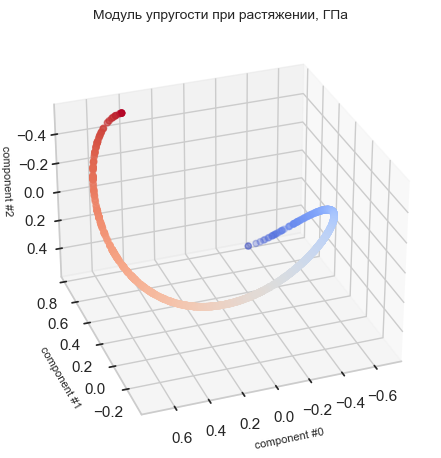

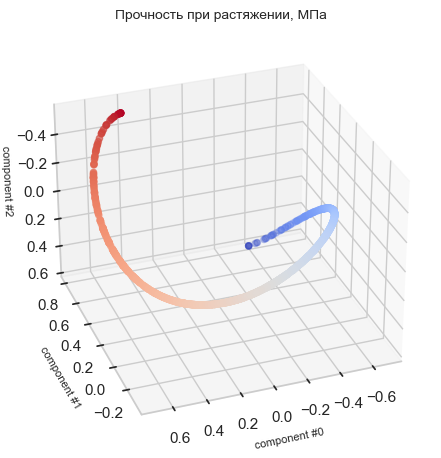

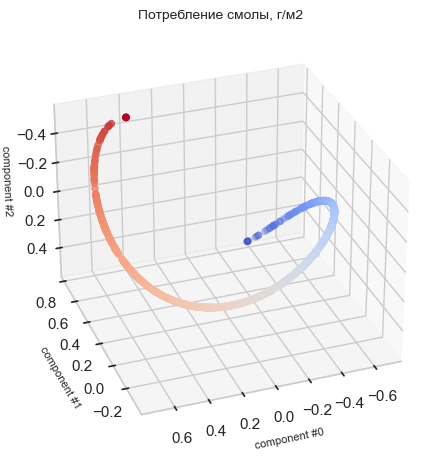

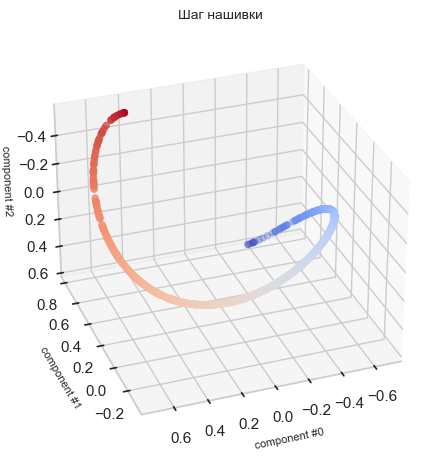

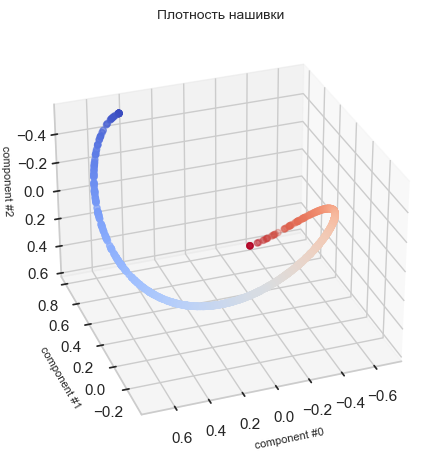

In [64]:
# проведем анализ главных компонент для каждого из стобцов
# визуализируем результаты для выявления закономерностей
# вернем стандартное отображение графиков в тетради
%matplotlib inline 
plt.figure(figsize = (30,30)) 
columns = 3 # количество стобцов для распределения графиков
rows = 4 # количество рядов
plot_number = 1 # инициализируем счетчик графиков
for column in df_no_angle.columns:
    # выделение главных компонент 
    pca = PCA(n_components=3)
    kernel_pca = KernelPCA(n_components=None, kernel="rbf", gamma=10, fit_inverse_transform=True, alpha=0.1)
    principal_components_kernel = kernel_pca.fit_transform(np.array(df_no_angle[[column]]))
    # визуализация результатов
    fig = plt.figure(figsize=(25,21))
    ax = fig.add_subplot(columns, rows, plot_number, projection="3d", elev=-150, azim=110)
    ax.scatter(principal_components_kernel[:, 0], principal_components_kernel[:, 1], principal_components_kernel[:, 2], c=df_no_angle[column], cmap='coolwarm')
    ax.set_ylabel("component #1", size=8)
    ax.set_xlabel("component #0", size=8)
    ax.set_zlabel("component #2", size=8)
    ax.set_title(column, size=10)
    plt.show()
    plot_number += 1

Выводы:
- наблюдается два типа распределения данных по кривизне линии;
- с учетом динамики значений данные можно разделить на 4 типа кривых следующим образом:

                            1) прочность при растяжении, температура вспышки;

                            2) модуль упругости при растяжении, соотношение матрица-наполнитель, поверхностная плотность, потребление смолы, шаг нашивки;

                            3) плотность, модуль упругости, количество отвердителя;
                            
                            4) содержание эпоксидных групп, плотность нашивки;
- таким образом, имеются сопадающие паттерны проекций переменных. Это может свидетельствовать о наличии линейной взаимосвязи между комбинациями переменных, безусловно, с некоторым допущением.

In [101]:
# учитывая результаты анализа данных с помощью метода главных компонент, то можно попровать сделать нормализацию не по признакам, а по образцам материалов, по которым получена база данных
# то есть сделаем нормализацию по рядам в массиве
# в качестве нормы для расчета используем норму (тип нормализации) по умолчанию - L2 (квадратный корень из суммы квадратов значений вектора)
df_normalized_sample = preprocessing.normalize(np.array(df))
df_normalized_sample = pd.DataFrame(df_normalized_sample, columns=df.columns)
df_normalized_sample.head(3) 

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0.000500,0.546440,0.198855,0.009829,0.005994,0.047958,0.056528,0.018843,0.807547,0.059220,0.0,0.001077,0.015343
1,0.000499,0.545436,0.198490,0.013434,0.006381,0.076473,0.056424,0.018808,0.806064,0.059111,0.0,0.001075,0.016121
2,0.000499,0.545406,0.198478,0.013407,0.007790,0.076468,0.056421,0.018807,0.806018,0.059108,0.0,0.001075,0.018807


In [184]:
# выведем описательную статистику
df_normalized_sample.describe().T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,1023.0,0.000885,0.000292,0.000127,0.000679,0.000870,0.001071,0.001917
"Плотность, кг/м3",1023.0,0.596851,0.068262,0.426922,0.550897,0.591796,0.641143,0.849813
"модуль упругости, ГПа",1023.0,0.220760,0.096055,0.000709,0.150909,0.220275,0.290903,0.524864
"Количество отвердителя, м.%",1023.0,0.033459,0.009452,0.008331,0.027296,0.033345,0.039492,0.071428
"Содержание эпоксидных групп,%_2",1023.0,0.006723,0.001052,0.004090,0.005971,0.006658,0.007403,0.010879
"Температура вспышки, С_2",1023.0,0.086423,0.015655,0.047958,0.075730,0.084935,0.096681,0.147861
"Поверхностная плотность, г/м2",1023.0,0.144601,0.083847,0.000230,0.080843,0.138261,0.202711,0.414371
"Модуль упругости при растяжении, ГПа",1023.0,0.022157,0.002625,0.015402,0.020344,0.021961,0.023811,0.032085
"Прочность при растяжении, МПа",1023.0,0.730067,0.073280,0.461035,0.686978,0.740396,0.781455,0.881868
"Потребление смолы, г/м2",1023.0,0.065911,0.019156,0.017538,0.052574,0.065476,0.078227,0.140666


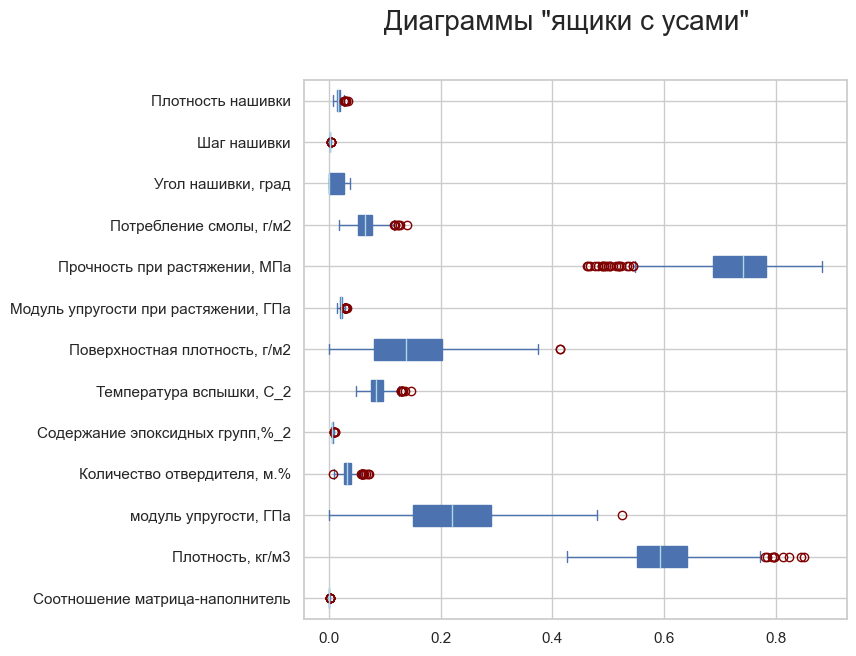

In [185]:
# используем диаграммы "ящик с усами" 
plt.figure(figsize = (7, 7))
plt.suptitle('Диаграммы "ящики с усами"', fontsize = 20)
plt.boxplot(df_normalized_sample, labels = df.columns, vert = False, patch_artist = True, meanline = True, boxprops = dict(facecolor = 'b', color = 'b'), \
            medianprops = dict(color = 'lightblue'), whiskerprops = dict(color = 'b'), capprops = dict(color = 'b'), flierprops = dict(markeredgecolor = 'maroon'))
plt.show()

Появившиеся выбросы не являются аномалиями, так как связаны с изменением значений. В связи с этим исправлять их не будем.

Для параметра Соотношение матрица-наполнитель
Mаксимальное значение: 0.001916919623306588
Минимальное значение 0.00012723326262278648
Среднее: 0.0008846013184853008
Медиана: 0.0008704325926638382


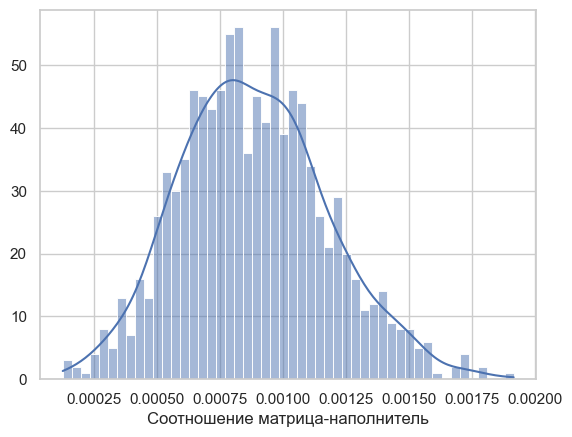

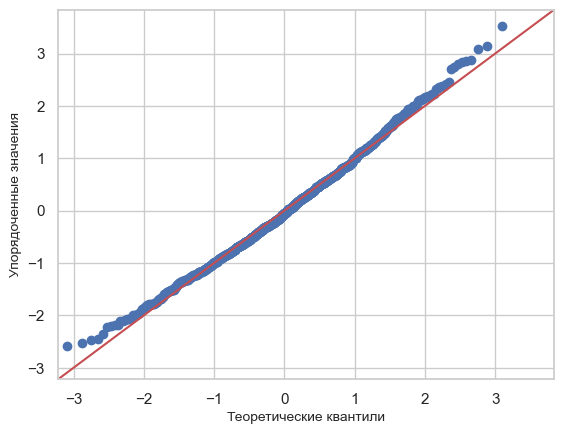

Для параметра Плотность, кг/м3
Mаксимальное значение: 0.8498125269605542
Минимальное значение 0.42692212492921505
Среднее: 0.596850648505003
Медиана: 0.5917962848555172


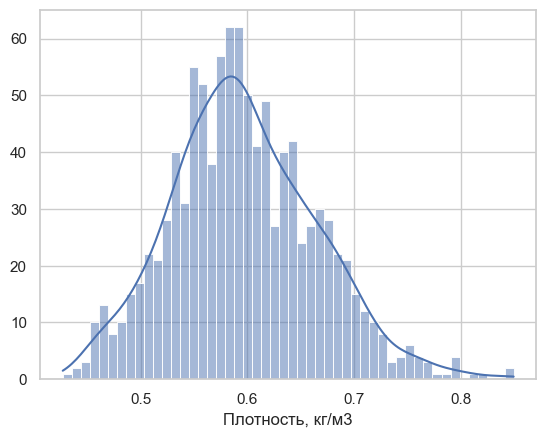

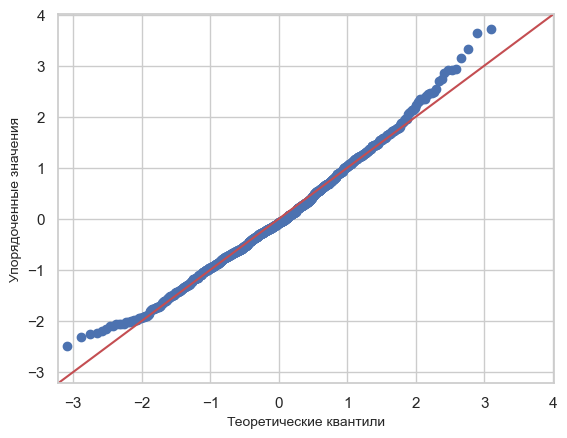

Для параметра модуль упругости, ГПа
Mаксимальное значение: 0.5248644827017969
Минимальное значение 0.0007089507067102431
Среднее: 0.22076019291762058
Медиана: 0.2202753894161921


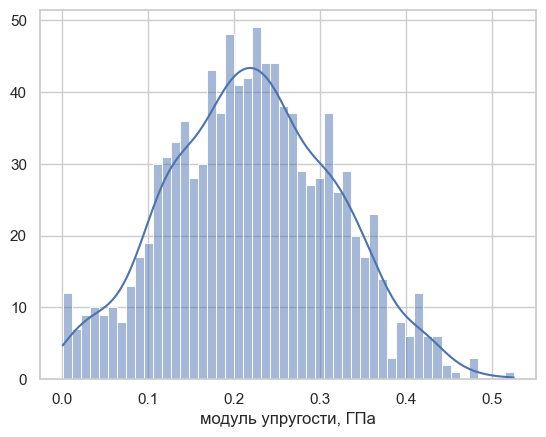

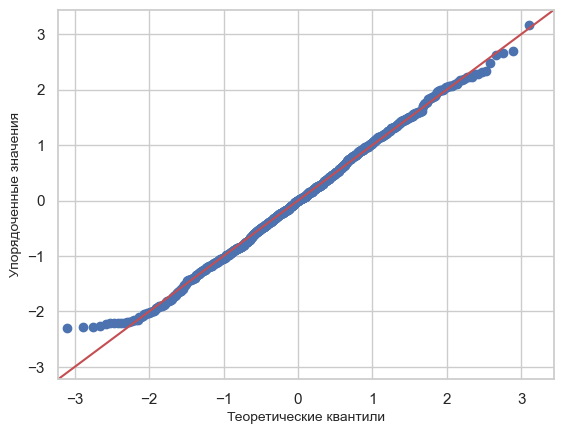

Для параметра Количество отвердителя, м.%
Mаксимальное значение: 0.07142834927168121
Минимальное значение 0.008330825908689055
Среднее: 0.03345923305374215
Медиана: 0.03334530663127606


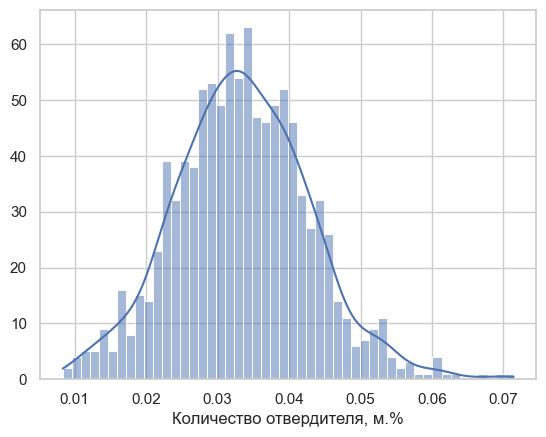

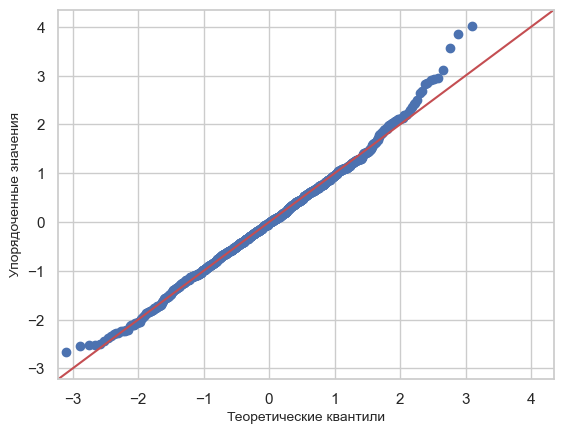

Для параметра Содержание эпоксидных групп,%_2
Mаксимальное значение: 0.01087897017640744
Минимальное значение 0.004090409661484961
Среднее: 0.006722733595370496
Медиана: 0.006658050572363019


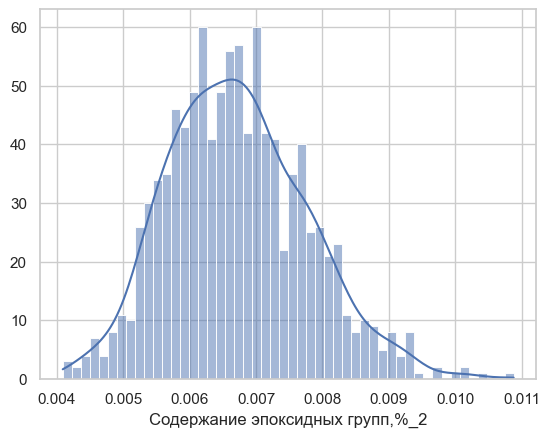

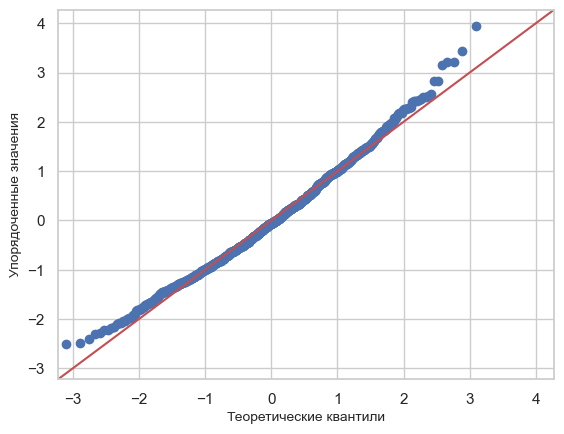

Для параметра Температура вспышки, С_2
Mаксимальное значение: 0.14786122253004255
Минимальное значение 0.04795839607142128
Среднее: 0.08642264945624457
Медиана: 0.0849350960798265


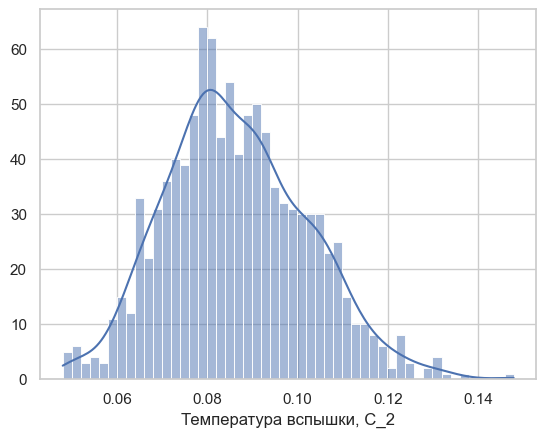

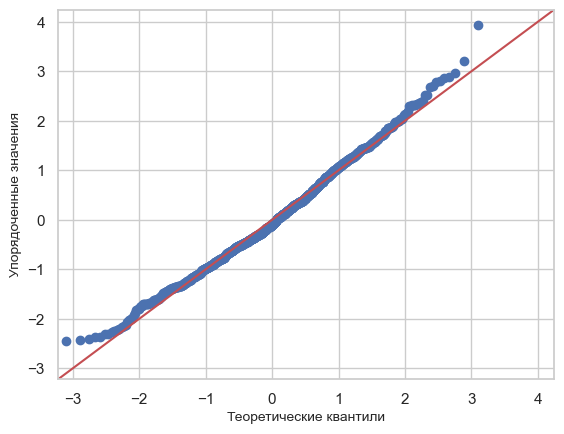

Для параметра Поверхностная плотность, г/м2
Mаксимальное значение: 0.4143706036929314
Минимальное значение 0.0002299610811492133
Среднее: 0.14460124591286014
Медиана: 0.13826091074605468


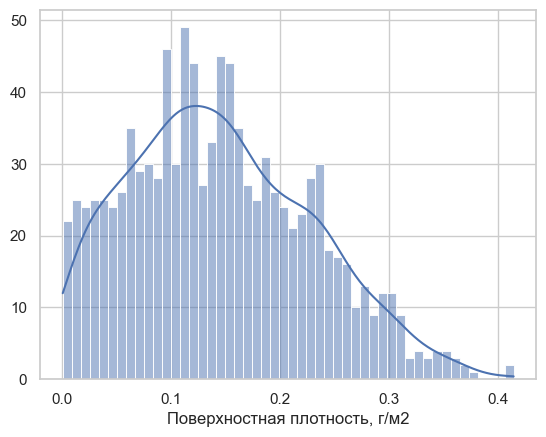

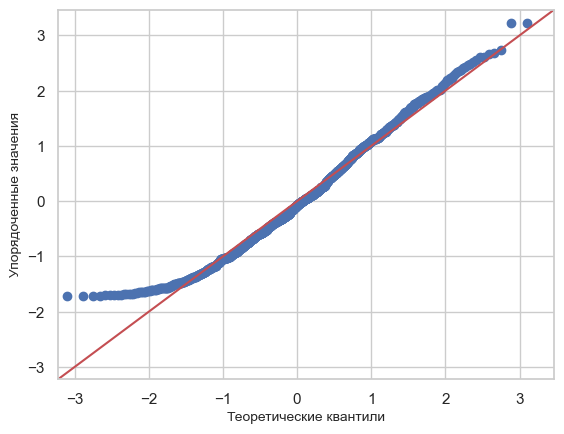

Для параметра Модуль упругости при растяжении, ГПа
Mаксимальное значение: 0.03208468385545289
Минимальное значение 0.015401883894513354
Среднее: 0.022157100071571876
Медиана: 0.02196120914147627


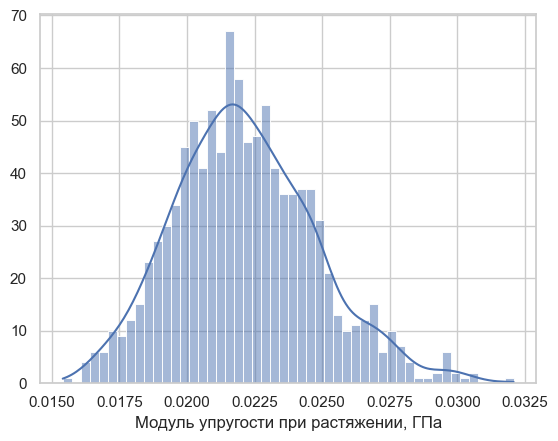

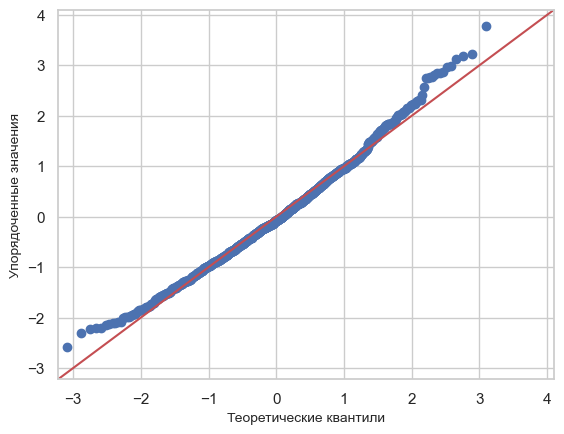

Для параметра Прочность при растяжении, МПа
Mаксимальное значение: 0.8818681483986971
Минимальное значение 0.46103483757846936
Среднее: 0.7300674815609415
Медиана: 0.7403961063528829


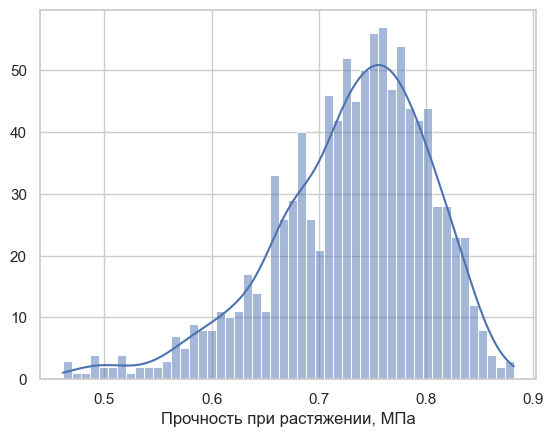

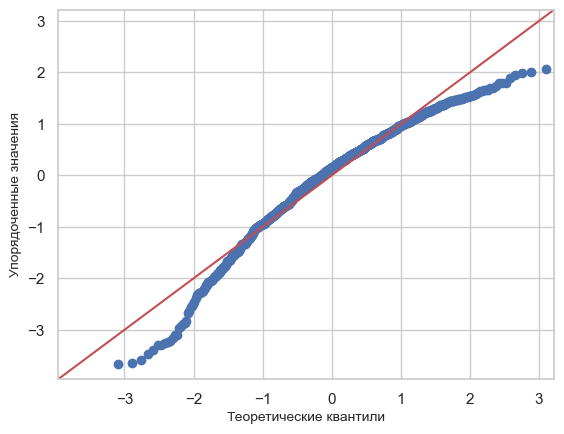

Для параметра Потребление смолы, г/м2
Mаксимальное значение: 0.140666197521562
Минимальное значение 0.017538369223542054
Среднее: 0.06591098188964926
Медиана: 0.06547646206388386


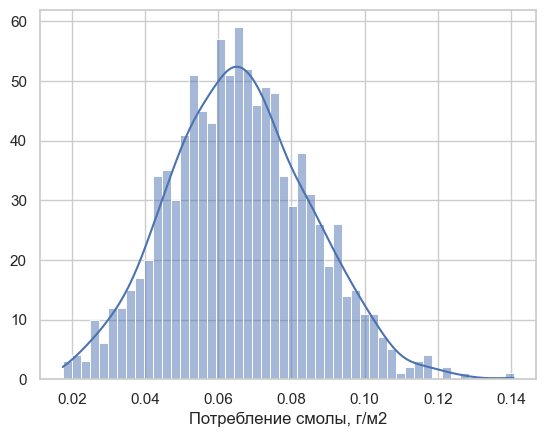

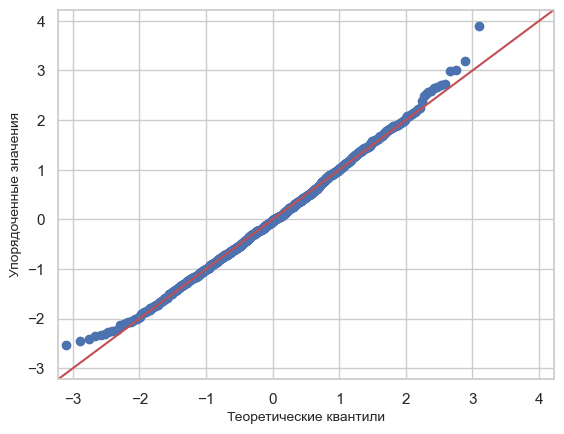

Для параметра Угол нашивки, град
Mаксимальное значение: 0.03772058634110856
Минимальное значение 0.0
Среднее: 0.013354957472948674
Медиана: 0.0


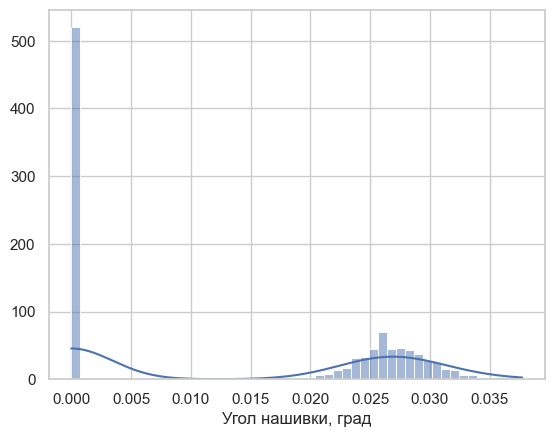

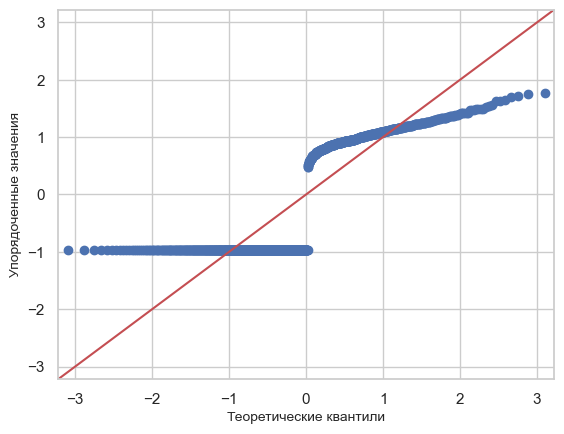

Для параметра Шаг нашивки
Mаксимальное значение: 0.004906381056313434
Минимальное значение 0.0
Среднее: 0.0020894541870117513
Медиана: 0.0020399043233939483


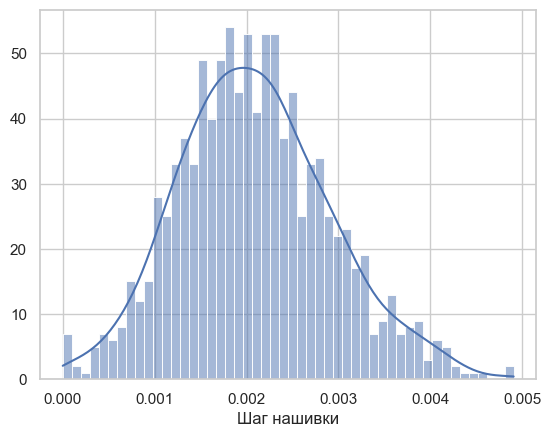

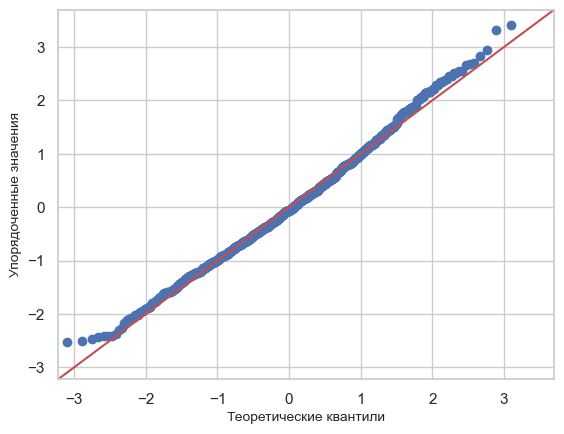

Для параметра Плотность нашивки
Mаксимальное значение: 0.03391226906973733
Минимальное значение 0.007157625019058997
Среднее: 0.01727155747128485
Медиана: 0.01721510382649426


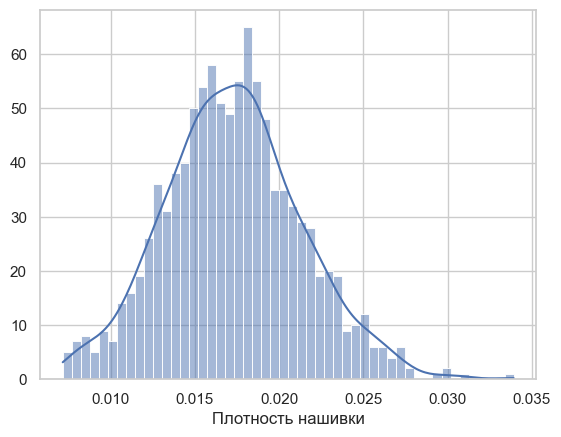

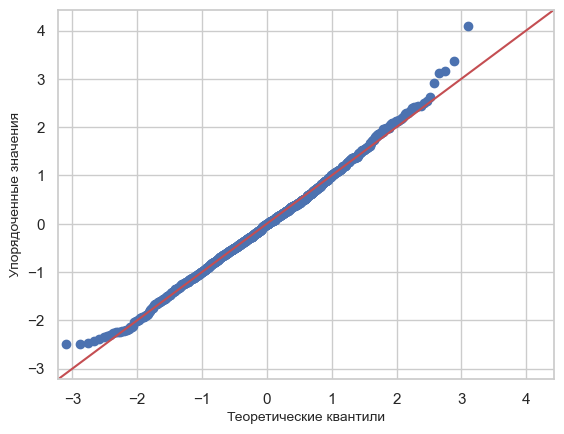

In [186]:
# посмотрим распределение каждой из переменных после второго способа нормализации
for i in df_normalized_sample.columns:
  try:
    distribution(df_normalized_sample[i])
  except:
    print(f'Error fo feature {i}')

Вывод:
в этом случае по некоторым столбцам произошли изменения распределения, наибольшие в стобцах "Температура вспышки", "Прочность при растяжении" и "Угол нашивки".

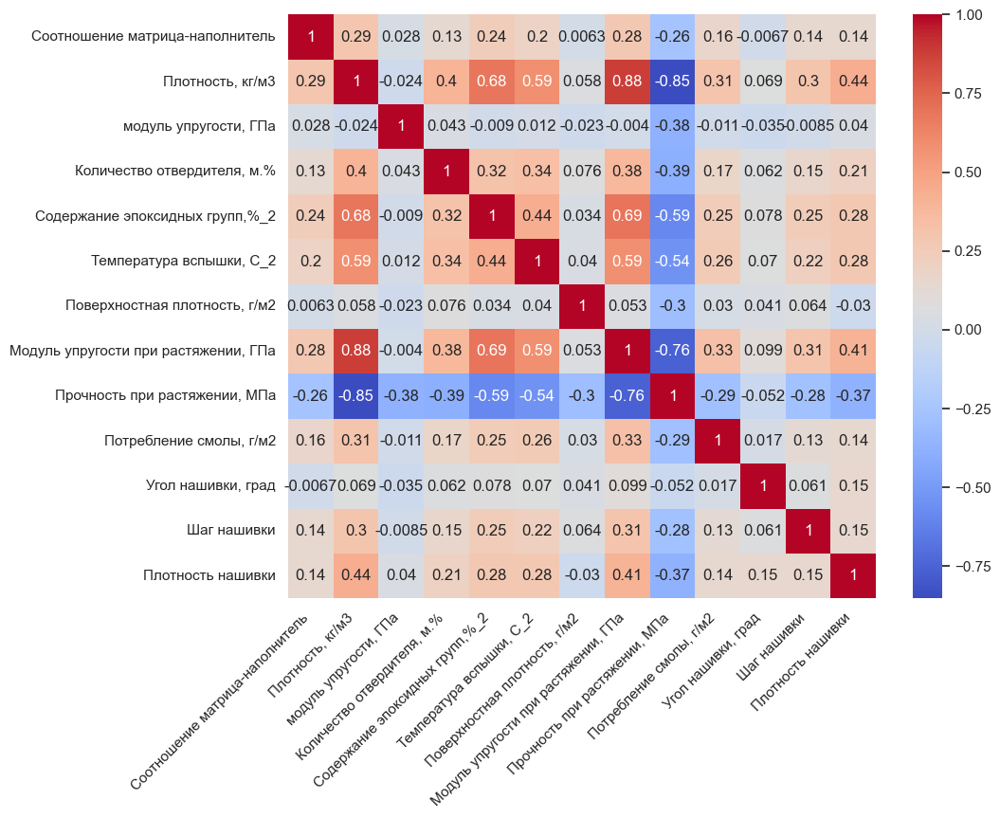

In [187]:
# посмотрим на наличие линейных корреляционных связей в нормализованном датасете
fig, ax = plt.subplots(figsize = (10, 8))
sns.heatmap(df_normalized_sample.corr(method = 'pearson'), annot = True, cmap = 'coolwarm')
plt.xticks(rotation = 45, ha='right')
plt.show()

По результатам корреляционного анализа наблюдаются:

- сильная положительная связь между модулем упругости при растяжении и плотностью (коэф. 0.88);
- сильная орицательная корреляционная связь между прочностью при растяжении и плотностью (коэф. - 0.85), между модулем упругости при растяжении и прочностью при растяжении (коэф. -0.76);
- средней силы, как положительная, так и отрицательная связи между многими переменными. Важность представляют взаимосвязи между модулем упругости при растяжении и количеством отвердителя, содержанием эпоксидных групп, температурой вспышки, потреблением смолы и плотностью нашивки; а также связи между прочностью при растяжении и модулем упругости, количеством отвердителя, содержанием эпоксидных групп, температурой вспышки, плотностью нашивки. Сила этих взаимосвязей схожая, однако разная направленность;
- слабые взаимосвязи между соотношением матрица-наполнитель и плотностью, содержанием эпоксидных групп и прочностью при растяжении.

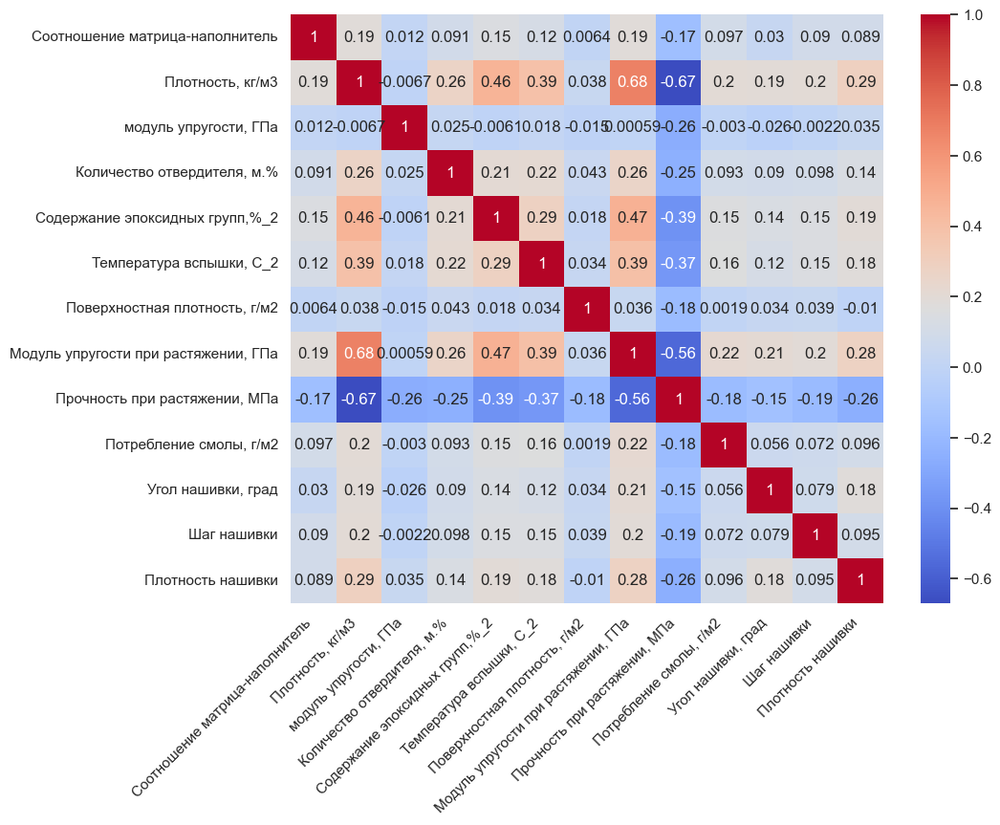

In [188]:
# посмотрим на наличие корреляционных связей в нормализованном датасете с применением непараметрического коэффициента 
fig, ax = plt.subplots(figsize = (10, 8))
sns.heatmap(df_normalized_sample.corr(method = 'kendall'), annot = True, cmap = 'coolwarm')
plt.xticks(rotation = 45, ha='right')
plt.show()

Вывод:
закономерности те же, что и при применении коэффициента корреляции Пирсона (см. выше), однако, сила связей слабее.

In [102]:
df_normalized_sample = df_normalized_sample.to_csv('/Users/kusita_1/Desktop/df compositum norm.csv')

Для применения в обучении необходимо последовательно изъять каждую из зависимых переменных и провести нормализацию по рядам таблицы без них.
Иначе в виду необратимости трансформации значений, полученных при нормализации, прогнозные данные будет невозможно интерпретировать.

In [80]:
# формирование датасета для модели прогнозирования модуля упругости при растяжении
df_elasticity = df.drop('Модуль упругости при растяжении, ГПа', axis=1)
df_elasticity.head(3)


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.0,738.736842,36.513195,22.267857,178.163161,210.0,3000.0,220.0,0.0,4.0,57.0
1,1.857143,2030.0,738.736842,50.000000,23.750000,284.615385,210.0,3000.0,220.0,0.0,4.0,60.0
2,1.857143,2030.0,738.736842,49.900000,28.992783,284.615385,210.0,3000.0,220.0,0.0,4.0,70.0


In [69]:
# выделение зависимой переменной "Модуль упругости при растяжении, ГПа" в отдельный массив 
y_elasticity = np.array(df['Модуль упругости при растяжении, ГПа'])
y_elasticity

array([70.        , 70.        , 70.        , ..., 74.7343437 ,
       74.04270842, 74.309704  ])

In [81]:
# выполним нормализацию и выведем результат
df_elasticity_norm_sample = preprocessing.normalize(np.array(df_elasticity))
df_elasticity_norm_sample = pd.DataFrame(df_elasticity_norm_sample, columns=df_elasticity.columns)
df_elasticity_norm_sample.head(3) 

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0.000500,0.546537,0.198890,0.009830,0.005995,0.047967,0.056538,0.807691,0.059231,0.0,0.001077,0.015346
1,0.000499,0.545533,0.198525,0.013437,0.006382,0.076486,0.056434,0.806206,0.059122,0.0,0.001075,0.016124
2,0.000499,0.545502,0.198514,0.013409,0.007791,0.076482,0.056431,0.806161,0.059118,0.0,0.001075,0.018810


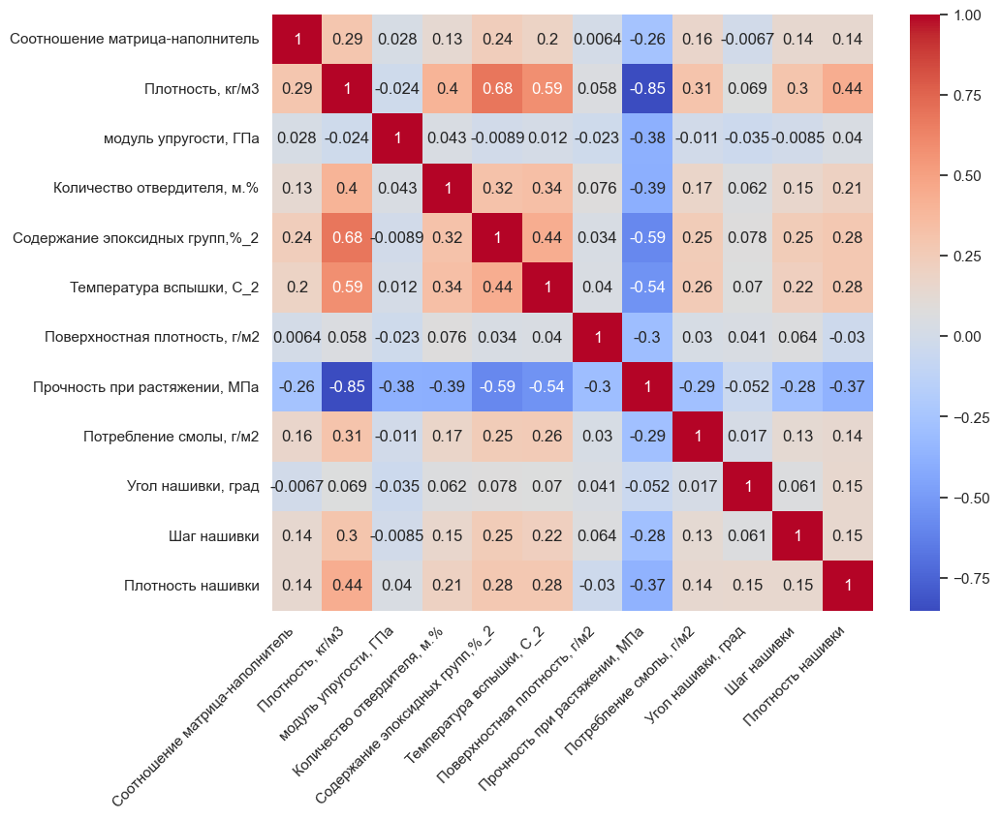

In [82]:
# посмотрим на наличие линейных корреляционных связей в этом датасете
fig, ax = plt.subplots(figsize = (10, 8))
sns.heatmap(df_elasticity_norm_sample.corr(method = 'pearson'), annot = True, cmap = 'coolwarm')
plt.xticks(rotation = 45, ha='right')
plt.show()

Вывод: паттерны зависимостей существенно не изменились.

In [72]:
# сохраним нормализованную с помощью normalize() таблицу в отдельный файл для удобства доступа впоследствии
df_elasticity_norm_sample = df_elasticity_norm_sample.to_csv('/Users/kusita_1/Desktop/df compositum norm elasticity.csv')

In [85]:
# формирование датасета для модели прогнозирования прочности при растяжении
df_resistance = df.drop('Прочность при растяжении, МПа', axis=1)
df_resistance.head(3)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.0,738.736842,36.513195,22.267857,178.163161,210.0,70.0,220.0,0.0,4.0,57.0
1,1.857143,2030.0,738.736842,50.000000,23.750000,284.615385,210.0,70.0,220.0,0.0,4.0,60.0
2,1.857143,2030.0,738.736842,49.900000,28.992783,284.615385,210.0,70.0,220.0,0.0,4.0,70.0


In [86]:
# выполним нормализацию и выведем результат
df_resistance_norm_sample = preprocessing.normalize(np.array(df_resistance))
df_resistance_norm_sample = pd.DataFrame(df_resistance_norm_sample, columns=df_resistance.columns)
df_resistance_norm_sample.head(3) 

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0.000848,0.926480,0.337155,0.016664,0.010163,0.081313,0.095843,0.031948,0.100407,0.0,0.001826,0.026014
1,0.000843,0.921612,0.335384,0.022700,0.010782,0.129214,0.095339,0.031780,0.099879,0.0,0.001816,0.027240
2,0.000843,0.921463,0.335329,0.022651,0.013160,0.129193,0.095324,0.031775,0.099863,0.0,0.001816,0.031775


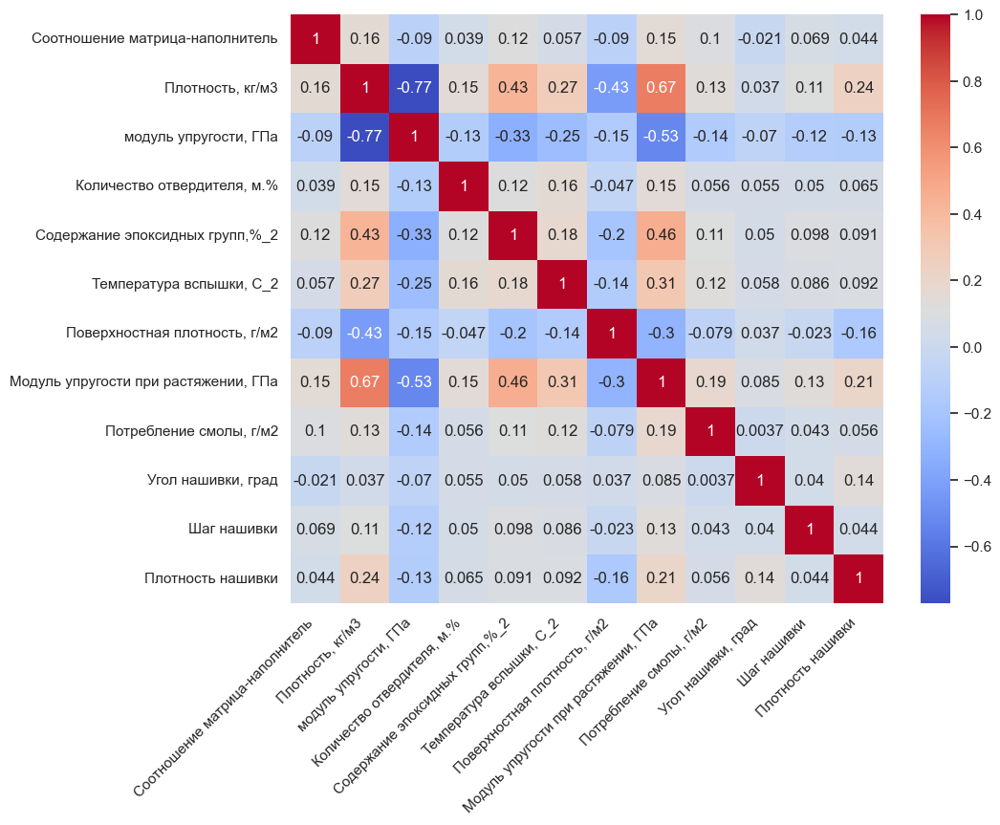

In [87]:
# посмотрим на наличие линейных корреляционных связей в этом датасете
fig, ax = plt.subplots(figsize = (10, 8))
sns.heatmap(df_resistance_norm_sample.corr(method = 'pearson'), annot = True, cmap = 'coolwarm')
plt.xticks(rotation = 45, ha='right')
plt.show()

In [75]:
# сохраним нормализованную с помощью normalize() таблицу в отдельный файл для удобства доступа впоследствии
df_resistance_norm_sample = df_resistance_norm_sample.to_csv('/Users/kusita_1/Desktop/df compositum norm resistance.csv')

In [88]:
# формирование датасета для написания нейронной сети, которая будет прогнозировать соотношение матрица-наполнитель
df_ratio = df.drop('Соотношение матрица-наполнитель', axis=1)
df_ratio.head(3)

,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,2030.0,738.736842,36.513195,22.267857,178.163161,210.0,70.0,3000.0,220.0,0.0,4.0,57.0
1,2030.0,738.736842,50.000000,23.750000,284.615385,210.0,70.0,3000.0,220.0,0.0,4.0,60.0
2,2030.0,738.736842,49.900000,28.992783,284.615385,210.0,70.0,3000.0,220.0,0.0,4.0,70.0


In [89]:
# выполним нормализацию и выведем результат
df_ratio_norm_sample = preprocessing.normalize(np.array(df_ratio))
df_ratio_norm_sample = pd.DataFrame(df_ratio_norm_sample, columns=df_ratio.columns)
df_ratio_norm_sample.head(3) 

,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0.546440,0.198855,0.009829,0.005994,0.047958,0.056528,0.018843,0.807547,0.059220,0.0,0.001077,0.015343
1,0.545437,0.198490,0.013434,0.006381,0.076473,0.056424,0.018808,0.806064,0.059111,0.0,0.001075,0.016121
2,0.545406,0.198478,0.013407,0.007790,0.076468,0.056421,0.018807,0.806018,0.059108,0.0,0.001075,0.018807


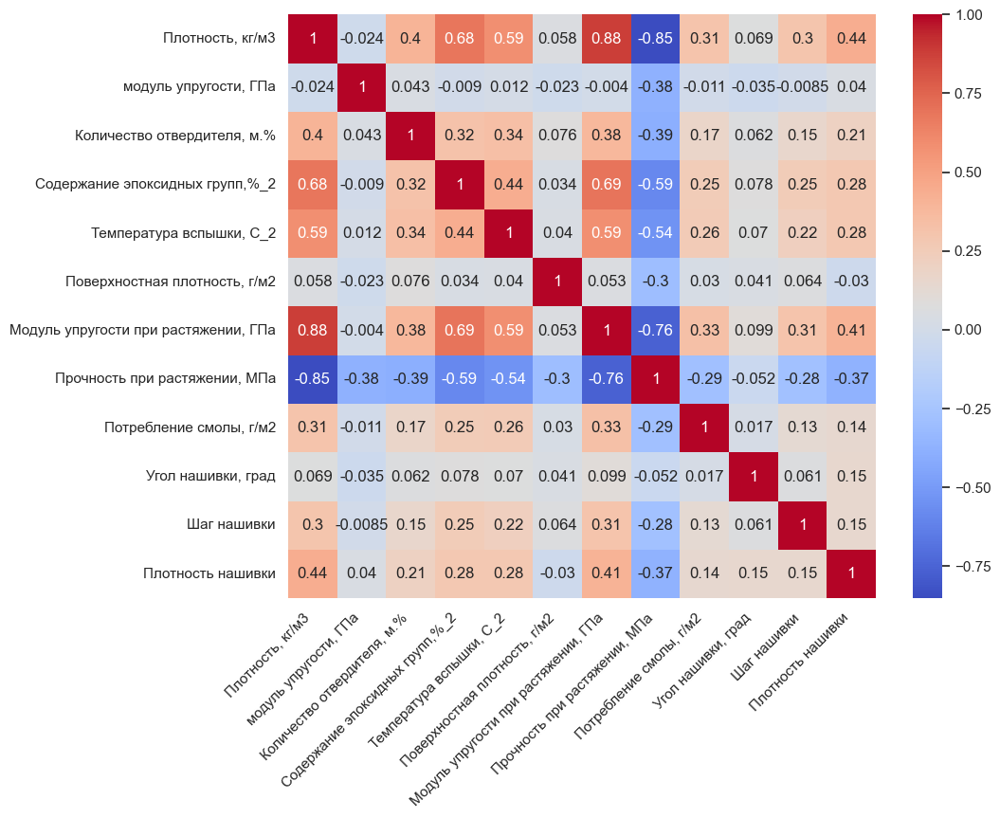

In [90]:
# посмотрим на наличие линейных корреляционных связей в этом датасете
fig, ax = plt.subplots(figsize = (10, 8))
sns.heatmap(df_ratio_norm_sample.corr(method = 'pearson'), annot = True, cmap = 'coolwarm')
plt.xticks(rotation = 45, ha='right')
plt.show()

In [78]:
# сохраним нормализованную с помощью normalize() таблицу в отдельный файл для удобства доступа впоследствии
df_ratio_norm_sample = df_ratio_norm_sample.to_csv('/Users/kusita_1/Desktop/df compositum norm ratio.csv')